---
# <small>DIGITAL IMAGE</small><br><font color="DODGERBLUE">PROCESSING</font>
---

* **The Main Principle**
<br>First of all, **Computer Graphics** derives a mathematical or geometrical model from original captured image to generate a *digital image*. But the next, do not confuse with **Digital Image Processing** and **Computer Vision** field, even both are complement each other. While *Digital Image Processing* output is still an image (modified), *Computer Vision* output will be a meaningful interpretation of its image through the use of Artificial Intelligence approach.
![Main Principle](img/principle.png)


* **How We Digitize an Image?**
<br>Simply put, the process of **sampling** (digitizing coordinate values of $(x, y)$) **+ quantization** (digitizing amplitude values $f(..)$) will generate an **digital image $f(x, y)$**, where the function represents intesity / gray level and the coordinate represents picture element (known as *pixel*).
![Digitize an Image](img/digitizing.png)
Therefore, the digital image can be simply coded in a matrix form as:
<br><br>$$\begin{bmatrix} f(0, 0) & f(0, 1) & ... & f(0, N-1) \\ f(1, 0) & f(1, 1) & ... & f(1, N-1) \\ \vdots & \vdots & \ddots & \vdots \\ f(M-1, 0) & f(M-1, 1) & ... & f(M-1, N-1) \end{bmatrix}$$
<br>where **M** is number of *rows* and **N** is number of *columns*. Since we'll use PYTHON, the pixel starts from $(0, 0)$ and ends in $(M-1, N-1)$. But if you want to use MATLAB, it'll start from $(1, 1)$ to $(M, N)$.


* **Bits Required for Digital Image Storage**
<br>Number of gray levels ($L$) allowed in each pixel formulated as $L = 2^k \iff k = \frac{ln(L)}{ln(2)}$, where $k$ denotes a bit (binary digit). Therefore, a ***k-bit image*** requires $N \times M \times k$ bits to store a digitized image. If in case $M == N$ (height and weight of pixel are the same), its formula can be simplified as $N^2 \times k$. For example, an image with
**L = 256 possible gray-level values** is called an $2^k = 2^8 = $ **8-bit** image; and if this 8-bit image has 32x32 dimension thus it'll need $32 \times 32 \times 8 = 8,912$ bit or equivalent to **1,024 byte = 1 KB** (remember: 8 bit = 1 byte and 1,024 byte = 1 kilobyte / KB).


* **Gradual Phases of Digital Image Processing**
<br>[**1**] [**Image Acquisition**]()
<br>[**=2**] [**Image Enhancement**]()
<br>[**=2**] [**Image Restoration**]()
<br>[**3**] [**Color Image Processing**]()
<br>[**4**] [**Wavelets (Multiresolution Processing)**]()
<br>[**5**] [**Compression**]()
<br>[**6**] [**Morphological Processing**]()
<br>[**7**] [**Segmentation**]()
<br>[**8**] [**Representation and Description**]()
<br>[**9**] [**Object Recognition**]()

**Prepared by:**
<br>NICHOLAS DOMINIC
<br>- Email: nicholas.dominic@binus.ac.id / ndominic75@icloud.com / dominicnick4@gmail.com
<br>- GitHub: www.github.com/NicholasDominic
<br>- LinkedIn: www.linkedin.com/in/nicholas-dominic

**References:**
<br>- Gonzalez, Rafael C. and Woods, Richard E. (n.d., 2002). ***Digital Image Processing***. New Jersey: Prentice-Hall, Inc.
<br>- Hidayatullah, Priyanto. (August 2017). ***Pengolahan Citra Digital: Teori dan Aplikasi Nyata***. Bandung: Penerbit Informatika.
<br>- Dey, Sandipan. (n.d., 2018). ***Hands-On Image Processing with Python***. Birmingham: Packt Publishing.

In [1]:
import cv2
from imutils import resize
from imutils.video import VideoStream
from numpy.random import uniform as un
from numpy import float32, uint8, array, arange, ones, amax, sqrt, concatenate, pi, cos, sin
from matplotlib import pyplot as plt
from skimage import exposure
from skimage.util import random_noise as rn
from skimage.morphology import remove_small_objects, convex_hull_image, skeletonize, binary_erosion
from skimage.feature import corner_harris, hog, blob_dog, blob_log, blob_doh
from skimage.filters import sobel
from skimage.segmentation import felzenszwalb, slic, quickshift, watershed, mark_boundaries

<font color="red"><b>TO BE NOTICED</b></font>
<br>I **downgrade** my CV2 version due to unavailable function of SIFT and SURF for Image Feature Extraction in the lastest version (in OPENCV v4.x, these functions have been *patented* except if there's any change in the next). I'll mark in comment if there's any minor change of use.

In [2]:
# version of cv2
cv2.__version__

'3.4.2'

# [1] Image Aquisition
Acquisition process can be as simple as image capturing (e.g. with camera), loading, and saving.

### [1.1] Image Loading
TO BE NOTICED
* **matplotlib.pyplot** represents **<font color="red">R</font><font color="limegreen">G</font><font color="blue">B</font>** image
* **cv2** represents **<font color="blue">B</font><font color="limegreen">G</font><font color="red">R</font>** image (reversed)

Therefore, if you want to use **cv.imread()** to load an image and **plt.imshow()** to show it, convert the image first.
<br>Otherwise, the use of **cv2.imshow()** will open a new window to show up an image (rather than directly showed on your IPYNB cell).

In [3]:
def plot_image(img, title=None, font_size=None, axis="off", color=cv2.COLOR_BGR2RGB): # since CV2 uses BGR image, convert BGR to RGB
    plt.title(title, fontsize=font_size) # plot figure name/title
    plt.axis(axis) # "off" == remove pyplot axes
    
    """
    You DO NOT NEED the if-else configuration below IF you're using OPENCV v4.0. or above.
    Simply do plt.imshow(cv2.cvtColor(img, color)) for either BGR or grayscale image.
    """
    
    if len(img.shape) == 3: # means it has 3-channels color
        plt.imshow(cv2.cvtColor(img, color))
    else: # for 1-channel image
        plt.imshow(img, cmap="gray")

In [4]:
# Original Image
img = cv2.imread("img/lena.png") # cv2.imread("path", cv2.IMREAD_COLOR(default)|cv2.IMREAD_GRAYSCALE(0)|cv2.IMREAD_UNCHANGED(-1))

# Grayscale Image
img_grayscaled = cv2.imread("img/lena.png", 0) # or cv2.imread("img/lena.png". cv2.IMREAD_GRAYSCALE)
# img_grayscaled = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Binary Image (MUST BE from Grayscale Image)
_, img_binary = cv2.threshold(img_grayscaled, 127, 255, cv2.THRESH_BINARY) # grayscale (NOT RGB) -> binary image

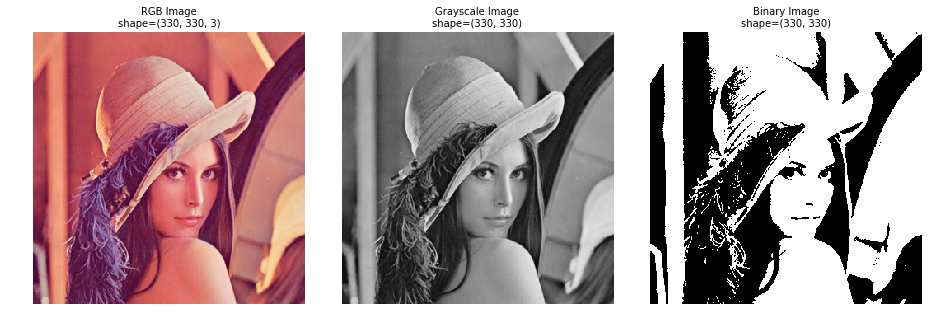

In [5]:
origin_fig_names = [
    "RGB Image\nshape={}".format(img.shape),
    "Grayscale Image\nshape={}".format(img_grayscaled.shape),
    "Binary Image\nshape={}".format(img_binary.shape)
] # will be set as title for each image

origin_fig = plt.figure(figsize=(13, 5)) # figsize(width/horizontally, height/vertically)
origin_img = [img, img_grayscaled, img_binary]

for i in range(len(origin_img)):
    x = origin_fig.add_subplot(1, 3, i+1) # position index always starts from 1, thus i+1
    plot_image(origin_img[i], title=origin_fig_names[i])
plt.tight_layout() # margin adjusted

### [1.2] Image Saving

In [6]:
# cv2.imwrite("img/lena.png", img) # cv2.imwrite("path/name.ext", your_img)

# [=2] Image Enhancement
This step runs **parallel** to *Image Restoration* (it means, you can do enhancement or restoration *at the same time*, according to its need.

Image enhacement (and also Image Restoration) works in two different domains: **spatial** and **frequency**. The book I mentioned above will explain its details, but in short *spatial domain* deals with image plane itself (do direct manipulation of its pixels), while *frequency domain* deals with the rate of pixel change based on Fourier Transform. The Python codes below will cover them simultaneously. And as you do an image enhancement, keep in mind that visual evaluation of image quality is a *highly subjective process* (so there's no statistical-based performance metrics available for this).

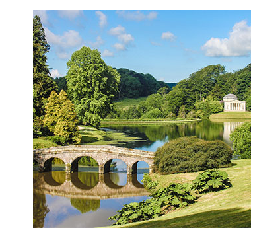

In [7]:
img2 = cv2.imread("img/garden.jpg") # load the second image
plot_image(img2)

### Point Operators

* **Arithmetic Operators 1: Intensity-based**
<br><br>&emsp; **Addition:** $f(u)=\begin{cases}
u+c & \text{, if $u+c \leqslant 255$}\\
255 & \text{, else}\\
\end{cases}$
<br><br>&emsp; **Subtraction:** $f(u)=\begin{cases}
u-c & \text{, if $u-c \geqslant 0$}\\
0 & \text{, else}\\
\end{cases}$
<br><br>&emsp; **Inverse:** $f(u) = 255 - u$
<br><br>&emsp; **Maximum:** $f(u) = max(u_1, u_2)$
<br><br>&emsp; **Minimum:** $f(u) = min(u_1, u_2)$
<br><br>where $u$ is $(x, y)$ image and $c$ is constant.

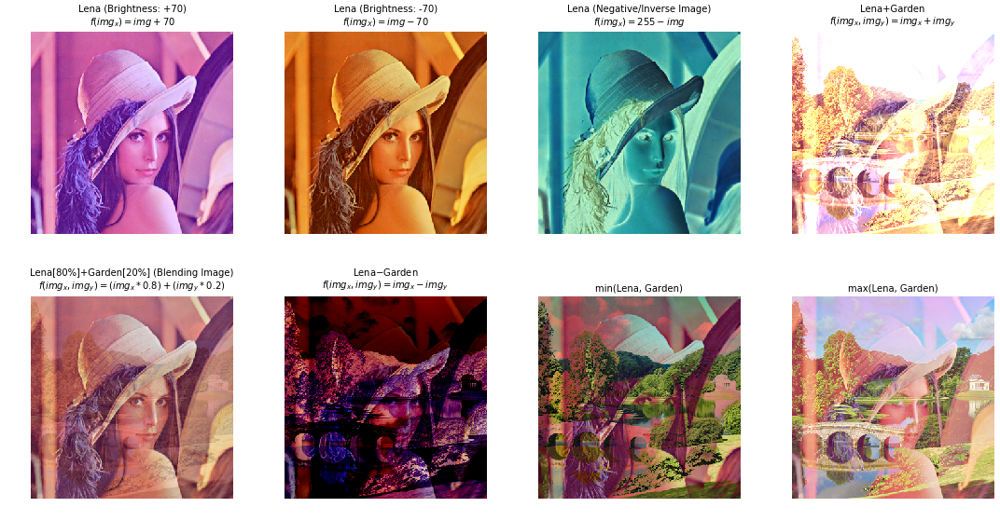

In [8]:
fig_names = [
    "Lena (Brightness: +70)\n$f(img_x) = img+70$",
    "Lena (Brightness: -70)\n$f(img_X) = img-70$",
    "Lena (Negative/Inverse Image)\n$f(img_x) = 255 - img$",
    "Lena+Garden\n$f(img_x, img_y) = img_x + img_y$",
    "Lena[80%]+Garden[20%] (Blending Image)\n$f(img_x, img_y) = (img_x * 0.8) + (img_y * 0.2)$",
    "Lena$-$Garden\n$f(img_x, img_y) = img_x - img_y$",
    "min(Lena, Garden)",
    "max(Lena, Garden)"
] # will be set as title for each image

aritmethics_img_fig = plt.figure(figsize=(15, 8)) # figsize(width/horizontally, height/vertically)
aritmethics_img = [
    cv2.add(img, 70), # Lena image with brightness +70
    cv2.subtract(img, 70), # Lena image with brightness -70
    255 - img, # inverse/negative of Lena image
    cv2.add(img, img2), # Lena+Garden
    cv2.addWeighted(img, .8, img2, .2, 0), # overlayed image, cv2.addWeighted(img1, weight1, img2, weight2, gammaValue)
    cv2.subtract(img, img2), # Lena-Garden
    cv2.min(img, img2), # minimum pixel between Lena and Garden
    cv2.max(img, img2) # maximum pixel between Lena and Garden
]

for i in range(len(aritmethics_img)):
    a = aritmethics_img_fig.add_subplot(2, 4, i+1) # position index always starts from 1, thus i+1
    plot_image(aritmethics_img[i], title=fig_names[i])
plt.tight_layout() # margin adjusted

* **Arithmetic Operators 2: Geometry-based (Image Warping / Transformation)**

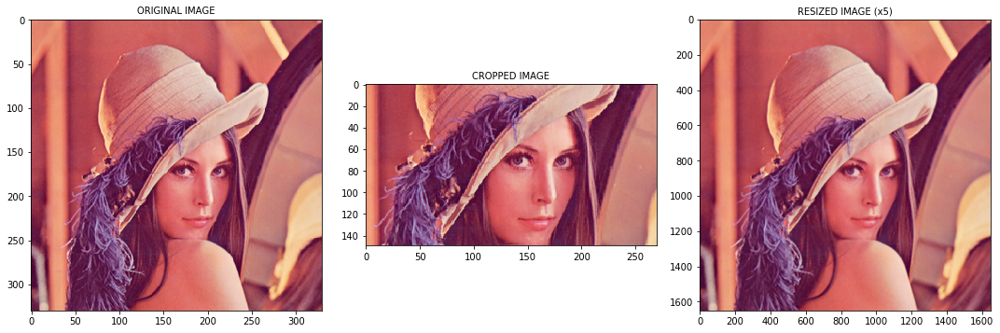

In [9]:
fig_t_names = ["ORIGINAL IMAGE", "CROPPED IMAGE", "RESIZED IMAGE (x5)"] # will be set as title for each image
t_fig = plt.figure(figsize=(15, 8)) # figsize(width/horizontally, height/vertically)
t_img = [
    img, # the original image of Lena
    img[100:250, 30:300], # cropped image [height/rows, width/cols]
    cv2.resize(src=img, dsize=None, fx=5, fy=5), # fx = scale along x-axis and fy = scale along y-axis
]

for i in range(len(t_img)):
    u = t_fig.add_subplot(1, 3, i+1) # position index always starts from 1, thus i+1
    plot_image(t_img[i], title=fig_t_names[i], axis="on")
plt.tight_layout() # margin adjusted

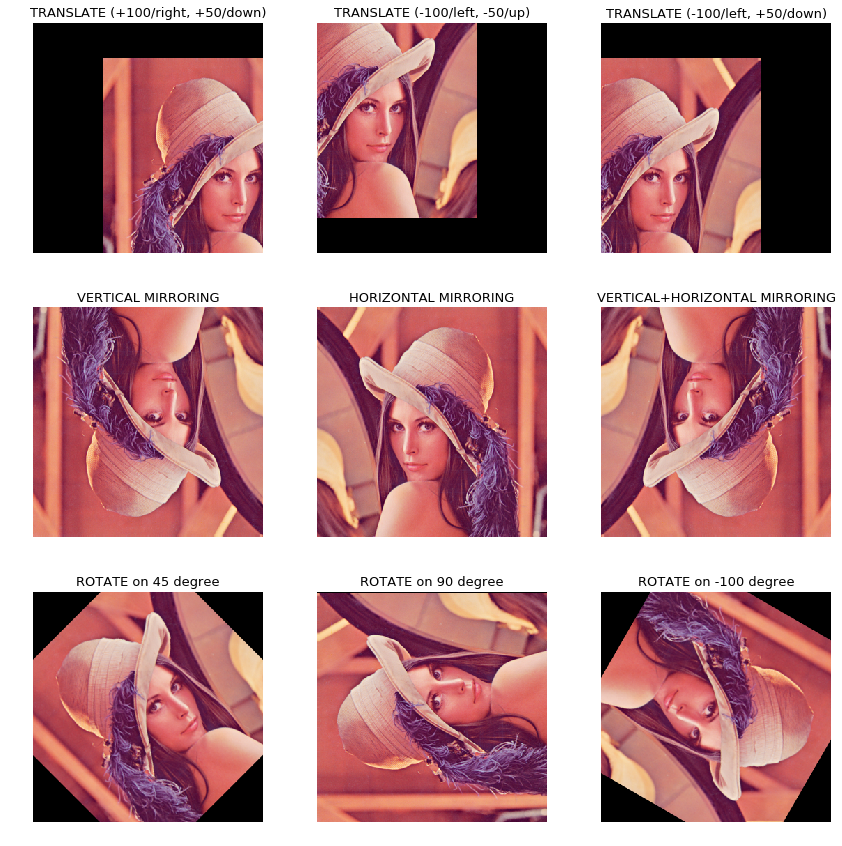

In [10]:
fig_transformed_names = [
    "TRANSLATE (+100/right, +50/down)",
    "TRANSLATE (-100/left, -50/up)",
    "TRANSLATE (-100/left, +50/down)",
    "VERTICAL MIRRORING",
    "HORIZONTAL MIRRORING",
    "VERTICAL+HORIZONTAL MIRRORING",
    "ROTATE on 45 degree",
    "ROTATE on 90 degree",
    "ROTATE on -100 degree"
] # will be set as title for each image

# TRANSLATION Matrix = [[1, 0, tx], [0, 1, ty]], where tx = shift along x-axis and ty = shift along y-axis
translation_matrix_1 = float32([[1, 0, 100],[0, 1, 50]])
translation_matrix_2 = float32([[1, 0, -100],[0, 1, -50]])
translation_matrix_3 = float32([[1, 0, -100],[0, 1, 50]])

# ROTATION Matrix = .getRotationMatrix2D(center_points, angle, scale=1)
# Alternative = cv.rotate(img, rotateCode=cv2.ROTATE_90_CLOCKWISE|cv2.ROTATE_90_COUNTERCLOCKWISE|cv2.ROTATE_180)
rows, cols = img.shape[:2]
rotation_matrix_1 = cv2.getRotationMatrix2D((rows/2, cols/2), 45, 1)
rotation_matrix_2 = cv2.getRotationMatrix2D((rows/2, cols/2), 90, 1)
rotation_matrix_3 = cv2.getRotationMatrix2D((rows/2, cols/2), -120, 1)

transformed_fig = plt.figure(figsize=(12, 12)) # figsize(width/horizontally, height/vertically)
transformed_img = [
    cv2.warpAffine(src=img, dsize=None, M=translation_matrix_1), # (+100/right, +50/down) translated image
    cv2.warpAffine(src=img, dsize=None, M=translation_matrix_2), # (-100/left, -50/up) translated image
    cv2.warpAffine(src=img, dsize=None, M=translation_matrix_3), # (-100/left, +50/down) translated image
    cv2.flip(img, flipCode=0), # vertically mirrored image
    cv2.flip(img, flipCode=1), # horizontally mirrored image
    cv2.flip(img, flipCode=-1), # vertical+horizontally mirrored image
    cv2.warpAffine(src=img, dsize=None, M=rotation_matrix_1), # 45 degrees rotated image
    cv2.warpAffine(src=img, dsize=None, M=rotation_matrix_2), # 90 degrees rotated image
    cv2.warpAffine(src=img, dsize=None, M=rotation_matrix_3), # -100 degrees rotated image
]

for i in range(len(transformed_img)):
    t = transformed_fig.add_subplot(3, 3, i+1) # position index always starts from 1, thus i+1
    plot_image(transformed_img[i], title=fig_transformed_names[i], font_size=13)
plt.tight_layout() # margin adjusted

When you combine translation with any other transformation method, it's called as **Affine Transformation**. But how it works in Python?<br>Here's the illustration that might help you. Imagine each dot in each image represents a single coordinate $(x, y)$ or $(cols, rows)$ point.
* (*from Source Image*) **source_points** = float32([[$x1, y1$], [$x2, y2$], [$x3, y3$]])
* (*from Destination Image*) **destination_points** = float32([[$x1', y1'$], [$x2', y2'$], [$x3', y3'$]])
![Affine_Transform](img/affinetransform.jpg)

In [11]:
def affine_transform(src_points, dest_points, image):
    affine_matrix = cv2.getAffineTransform(src_points, dest_points)
    return cv2.warpAffine(image, affine_matrix, (image.shape[0], image.shape[1])) # (rows, cols)

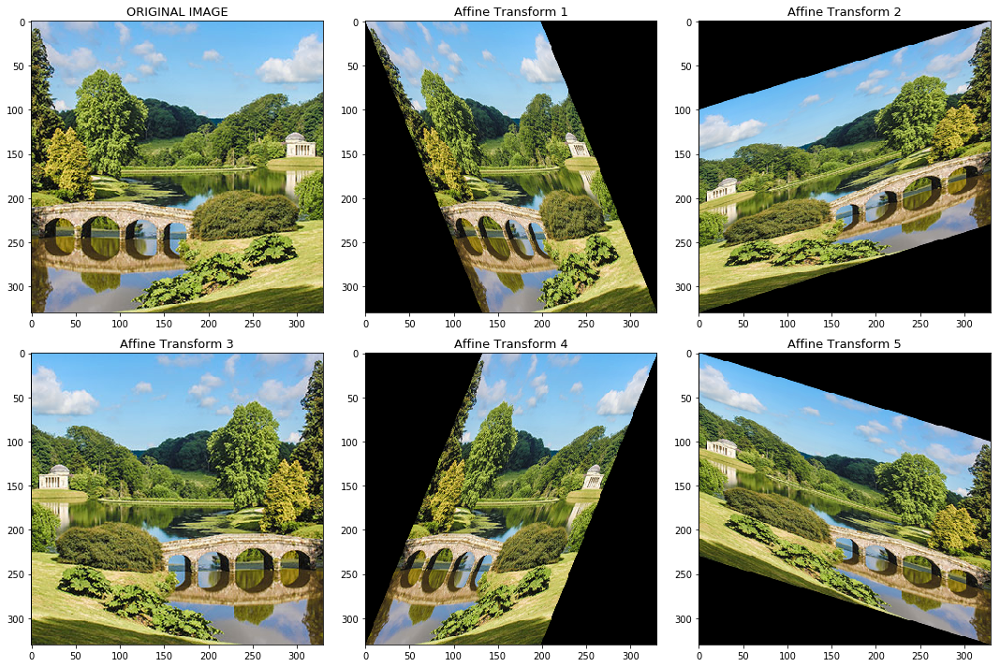

In [12]:
affine_names = ["ORIGINAL IMAGE", "Affine Transform"] # will be set as title for each image

rows, cols = img2.shape[:2] # will return rows = cols = 330
src_points = float32([[0, 0], [cols, 0], [0, rows]])
    
            # float32([[x1, y1], [x2, y2], [x3, y3]])
dst_points1 = float32([[0, 0], [int(.6*cols), 0], [int(.4*cols), rows]])
dst_points2 = float32([[cols, 0], [0, 100], [cols, rows-100]])
dst_points3 = float32([[cols, 0], [0, 0], [cols, rows]])
dst_points4 = float32([[int(.4*cols), 0], [cols, 0], [0, rows]])
dst_points5 = float32([[cols, 100], [0, 0], [cols, rows]])

affine_fig = plt.figure(figsize=(15, 10)) # figsize(width/horizontally, height/vertically)
affine_img = [
    img2, # the original image
    affine_transform(src_points, dst_points1, img2),
    affine_transform(src_points, dst_points2, img2),
    affine_transform(src_points, dst_points3, img2),
    affine_transform(src_points, dst_points4, img2),
    affine_transform(src_points, dst_points5, img2)
]

for i in range(len(affine_img)):
    a = affine_fig.add_subplot(2, 3, i+1) # position index always starts from 1, thus i+1
    plot_image(affine_img[i], title=affine_names[0] if i == 0 else affine_names[1] + " " + str(i), font_size=13, axis="on")
plt.tight_layout() # margin adjusted

* **Thresholding**
<br><br><font color="red"><b>TO BE NOTICED</b></font>
<br>While do **THRESHOLDING**, your image <font color="red">must in the form of <b>grayscale</b></font>. Otherwise it'll produce mistaken result or even an error.

In [13]:
# SIMPLE Thresholding
_, thresh_binary = cv2.threshold(img_grayscaled, 127, 255, cv2.THRESH_BINARY)
_, thresh_binary_inv = cv2.threshold(img_grayscaled, 127, 255, cv2.THRESH_BINARY_INV)
_, thresh_trunc = cv2.threshold(img_grayscaled, 127, 255, cv2.THRESH_TRUNC)
_, thresh_tozero = cv2.threshold(img_grayscaled, 127, 255, cv2.THRESH_TOZERO)
_, thresh_tozero_inv = cv2.threshold(img_grayscaled, 127, 255, cv2.THRESH_TOZERO_INV)

# ADAPTIVE Thresholding
adapt_mean_tresh = cv2.adaptiveThreshold(img_grayscaled, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 2) # threshold value is the mean of neighbourhood area
adapt_gaussian_tresh = cv2.adaptiveThreshold(img_grayscaled, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2) # threshold value is the weighted sum of neighbourhood values where weights are a gaussian window

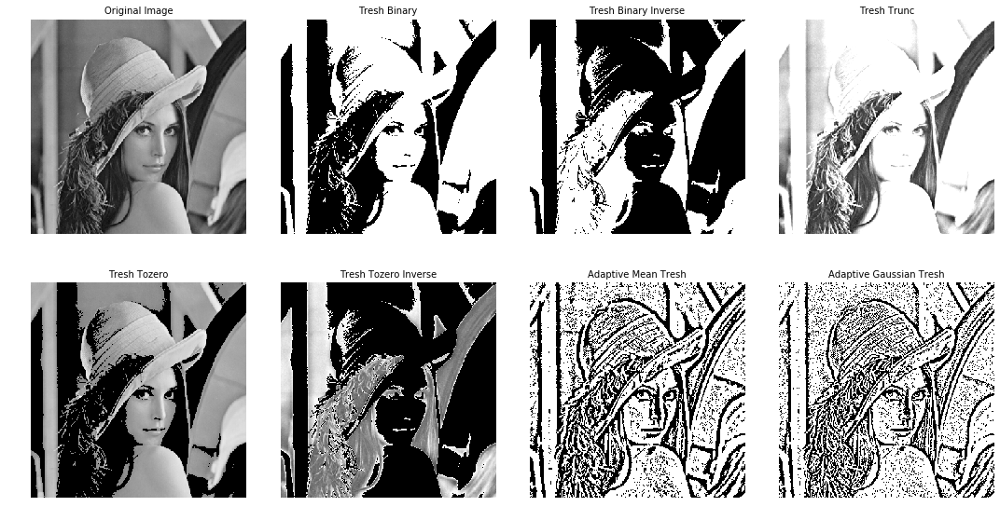

In [14]:
fig_thresh_names = [
    "Original Image",
    "Tresh Binary",
    "Tresh Binary Inverse",
    "Tresh Trunc",
    "Tresh Tozero",
    "Tresh Tozero Inverse",
    "Adaptive Mean Tresh",
    "Adaptive Gaussian Tresh"
] # will be set as title for each image

thresh_img_fig = plt.figure(figsize=(15, 8)) # figsize(width/horizontally, height/vertically)
thresh_img = [img_grayscaled, thresh_binary, thresh_binary_inv, thresh_trunc, thresh_tozero, thresh_tozero_inv, adapt_mean_tresh, adapt_gaussian_tresh]

for i in range(len(thresh_img)):
    c = thresh_img_fig.add_subplot(2, 4, i+1) # position index always starts from 1, thus i+1
    plot_image(thresh_img[i], title=fig_thresh_names[i])
plt.tight_layout() # margin adjusted

* **Bitwise Operators**
<br><br><font color="red"><b>TO BE NOTICED</b></font>
<br>While do **BITWISE OPERATOR**, your image <font color="red">must in the form of <b>binary</b></font>. Otherwise it'll produce mistaken result or even an error.
<br>As reminder, below is the **Truth Table** of conjunction (**AND**), disjunction (**OR**), and exclusive disjuntion (**XOR**).

| x | y | NOT(x) | NOT(y) | AND(x, y) | OR(x, y) | XOR(x, y) |
| --- | --- | --- | --- | --- | --- | --- |
| 1 | 1 | 0 | 0 | 1 | 1 | 0 |
| 1 | 0 | 0 | 1 | 0 | 1 | 1 |
| 0 | 1 | 1 | 0 | 0 | 1 | 1 |
| 0 | 0 | 1 | 1 | 0 | 0 | 0 |

In [15]:
_, binary_circle = cv2.threshold(cv2.imread("img/circle.png"), 127, 255, cv2.THRESH_BINARY) # load CIRCLE image and convert it to binary
_, binary_triangle = cv2.threshold(cv2.imread("img/triangle.jpg"), 127, 255, cv2.THRESH_BINARY) # load TRIANGLE image and convert it to binary

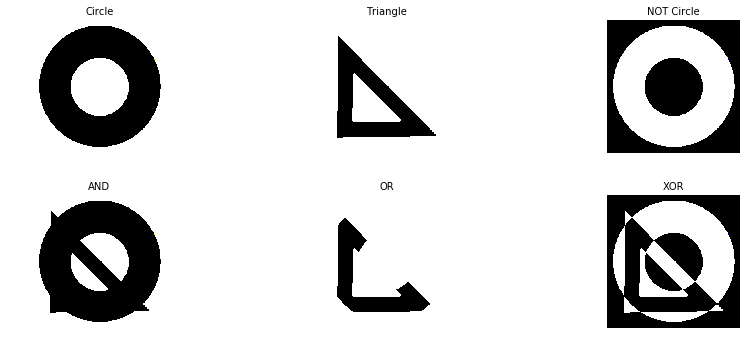

In [16]:
bitwise_img_names = ["Circle", "Triangle", "NOT Circle", "AND", "OR", "XOR"] # will be set as title for each image

bitwise_img_fig = plt.figure(figsize=(13, 5)) # figsize(width/horizontally, height/vertically)
bitwise_img = [
    binary_circle,
    binary_triangle,
    cv2.bitwise_not(binary_circle),
    cv2.bitwise_and(binary_circle, binary_triangle, mask=None),
    cv2.bitwise_or(binary_circle, binary_triangle, mask=None),
    cv2.bitwise_xor(binary_circle, binary_triangle, mask=None)
]

for i in range(len(bitwise_img)):
    d = bitwise_img_fig.add_subplot(2, 3, i+1) # position index always starts from 1, thus i+1
    plot_image(bitwise_img[i], title=bitwise_img_names[i])
plt.tight_layout() # margin adjusted

* **Image Histogram**
<br>Image Histrogram denotes a comparison between **intensity / gray level (x-axis)** and **total pixels (y-axis)** of an image.
<br>In dealing with:
<br>&emsp; - ***Luminosity/Brightness*** can be measured by **the mean** of intesity level of all pixels.
<br>&emsp;&emsp;&ensp; The higher the mean, the brighter the image. The histogram will show right-inclined appearance (close to 255).
<br>&emsp;&emsp;&ensp; The lower the mean, the darker the image. The histogram will show left-inclined appearance (close to 0).
<br>&emsp; - ***Contrast*** can be measured by **the standard deviation** of intensity level of all pixels.
<br>&emsp;&emsp;&ensp; The higher the stdev, the more constrast the image. The histogram will show well-distributed (divergence) appearance.
<br>&emsp;&emsp;&ensp; The lower the stdev, the less contrast the image. The histogram will show convergence-at-one-point appearance.

In [17]:
def create_hist(image, channel=0):
    return cv2.calcHist(images=[image], channels=[0], mask=None, histSize=[256], ranges=[0, 256])

In [18]:
histname = ["Low Brightness", "Normal", "High Brightness"] # will be set as title for each image
img2_grayscaled_normal_brightness = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)
img2_grayscaled_low_brightness = cv2.subtract(img2_grayscaled_normal_brightness, 45)
img2_grayscaled_high_brightness = cv2.add(img2_grayscaled_normal_brightness, 45)

In [19]:
img2_grayscaled_high_brightness

array([[240, 237, 237, ..., 214, 214, 214],
       [243, 241, 237, ..., 215, 215, 215],
       [242, 246, 242, ..., 215, 215, 215],
       ...,
       [ 96, 102,  99, ...,  93,  90,  96],
       [ 95,  96,  96, ...,  94, 101, 103],
       [101, 104, 104, ..., 112, 114, 116]], dtype=uint8)

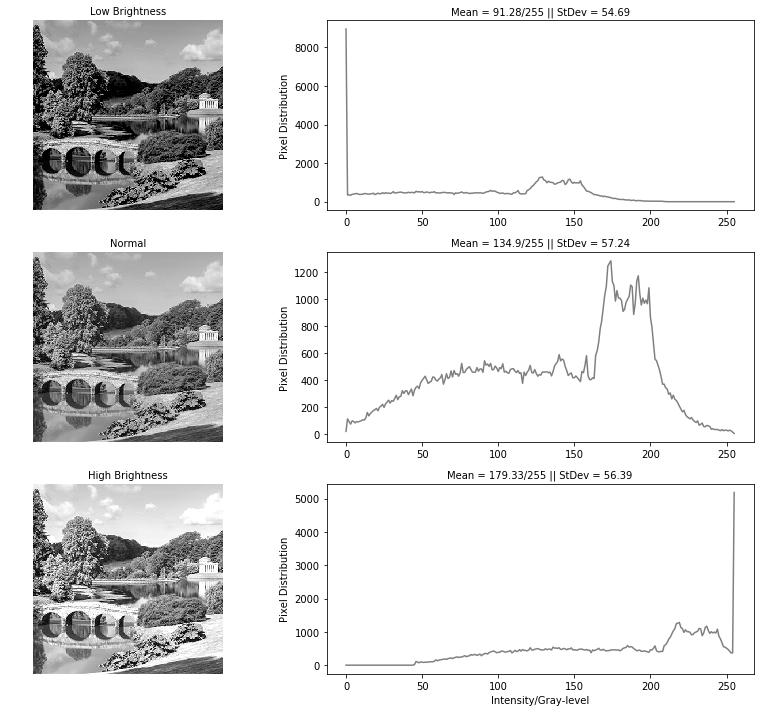

In [20]:
grayhist_img = [
    img2_grayscaled_low_brightness, create_hist(img2_grayscaled_low_brightness),
    img2_grayscaled_normal_brightness, create_hist(img2_grayscaled_normal_brightness),
    img2_grayscaled_high_brightness, create_hist(img2_grayscaled_high_brightness)
]

grayhist_fig = plt.figure(figsize=(12, 10)) # figsize(width/horizontally, height/vertically)
for i in range(len(grayhist_img)):
    x = grayhist_fig.add_subplot(3, 2, i+1) # position index always starts from 1, thus i+1
    if i % 2 == 0:
        plot_image(grayhist_img[i], title=histname[int(i/2)])
    else:
        plt.plot(grayhist_img[i], color="gray")
        plt.title("Mean = {}/255 || StDev = {}".format(
            round(cv2.meanStdDev(grayhist_img[int(i-1)])[0][0][0], 2), # the mean
            round(cv2.meanStdDev(grayhist_img[int(i-1)])[1][0][0], 2) # the standard deviation
            ), fontsize=10
        )
        if i == 5: # print x-label only in the last histogram plot
            plt.xlabel("Intensity/Gray-level")
        plt.ylabel("Pixel Distribution") # print y-label in all histogram plots
plt.tight_layout() # margin adjusted

In [21]:
img3 = cv2.imread("img/nightsky.jpg") # load third image, which has dark-dominant colors
img4 = cv2.imread("img/landscape.jpg") # load fourth image, which has light-dominant colors

In [22]:
def create_color_hist(img, title=None):
    color_channels = ['b', 'g', 'r'] # set color channels as blue, green, and red (BGR)
    colorhist_fig = plt.figure(figsize=(16, 4)) # figsize(width/horizontally, height/vertically)

    x = colorhist_fig.add_subplot(121) # first .add_subplot(nrows, ncols, idx)
    plot_image(img) # plot the original image
    plt.title(title) # set as title for each image

    x = colorhist_fig.add_subplot(122) # second .add_subplot(nrows, ncols, idx)
    [plt.plot(cv2.calcHist([img], [i], None, [256], [0, 256]), color=col) for i, col in enumerate(color_channels)] # plot the histogram
    plt.title("Mean(B, G, R) = [{}/255, {}/255, {}/255]\nStDev(B, G, R) = [{}, {}, {}]".format(
            round(cv2.meanStdDev(img)[0][0][0], 2), round(cv2.meanStdDev(img)[0][1][0], 2), round(cv2.meanStdDev(img)[0][2][0], 2), # the mean of each color channel
            round(cv2.meanStdDev(img)[1][0][0], 2), round(cv2.meanStdDev(img)[1][1][0], 2), round(cv2.meanStdDev(img)[1][2][0], 2) # the stdev of each color channel
        ), fontsize=10
    )
    plt.xlabel("Intensity") # set x-label
    plt.ylabel("Pixel Distribution") # set y-label
    plt.legend(["BLUE Channel", "GREEN Channel,", "RED Channel"]) # set legends

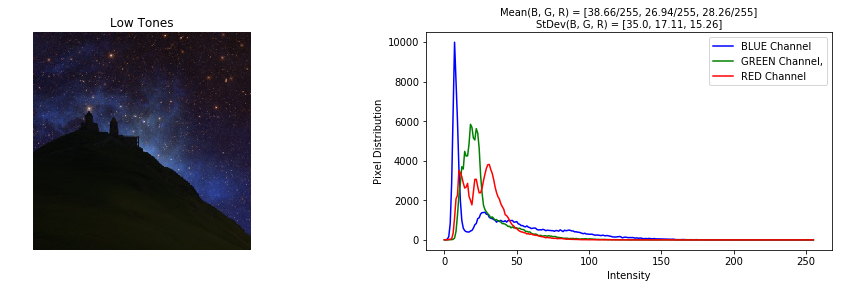

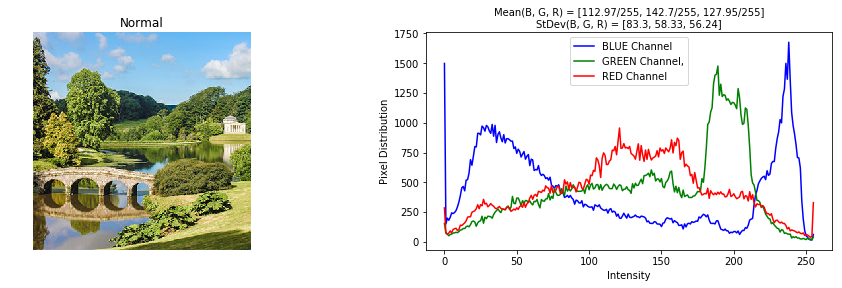

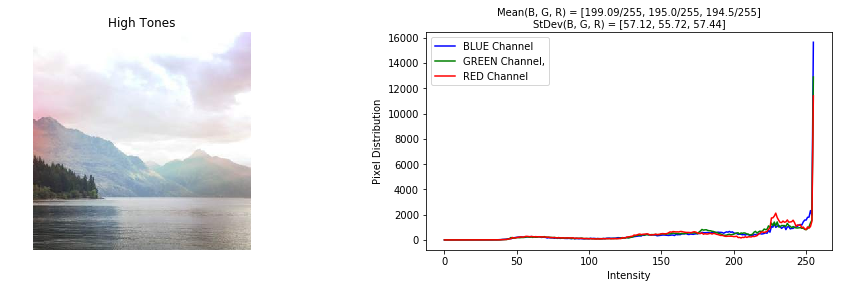

In [23]:
create_color_hist(img3, title="Low Tones")
create_color_hist(img2, title="Normal")
create_color_hist(img4, title="High Tones")

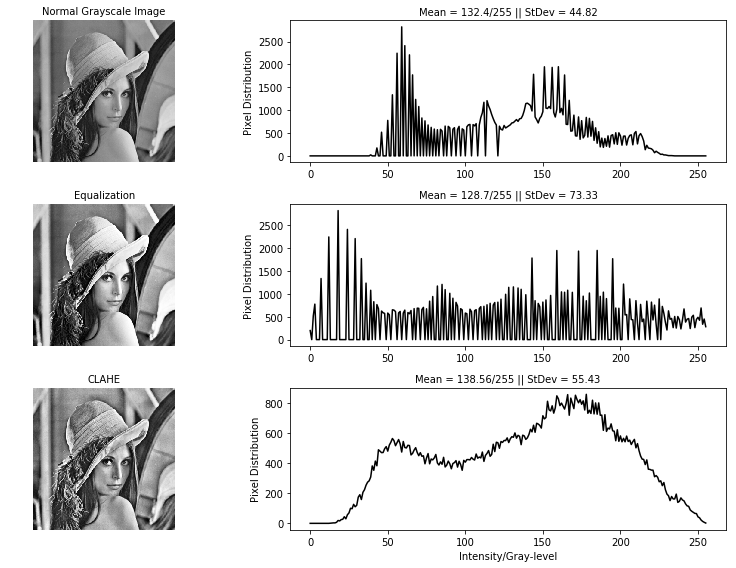

In [24]:
equalized_img = cv2.equalizeHist(img_grayscaled) # Equalization applied
clahe_img = cv2.createCLAHE(clipLimit=3, tileGridSize=(15, 15)).apply(img_grayscaled)
                # Contrast Limited Adaptive Histogram Equalization (CLAHE) applied
                # where clipLimit acts as threshold for contrast limiting

equ_names = ["Normal Grayscale Image", "Equalization", "CLAHE"] # will be set as title for each image
equ_img = [
    img_grayscaled, create_hist(img_grayscaled),
    equalized_img, create_hist(equalized_img),
    clahe_img, create_hist(clahe_img)
]

equ_fig = plt.figure(figsize=(12, 8)) # figsize(width/horizontally, height/vertically)
for i in range(len(equ_img)):
    e = equ_fig.add_subplot(3, 2, i+1) # position index always starts from 1, thus i+1
    if i % 2 == 0:
        plot_image(equ_img[i], title=equ_names[int(i/2)])
    else:
        plt.plot(equ_img[i], color="k")
        plt.title("Mean = {}/255 || StDev = {}".format(
            round(cv2.meanStdDev(equ_img[int(i-1)])[0][0][0], 2), # the mean
            round(cv2.meanStdDev(equ_img[int(i-1)])[1][0][0], 2) # the standard deviation
            ), fontsize=10
        )
        if i == 5: # print x-label only in the last histogram plot
            plt.xlabel("Intensity/Gray-level")
        plt.ylabel("Pixel Distribution") # print y-label in all histogram plots
plt.tight_layout() # margin adjusted

According to [this source](https://stackoverflow.com/questions/15007304/histogram-equalization-not-working-on-color-image-opencv), **equalization involves intensity values of the image only**, not the color components (thus it works fine with grayscale image). So for a simple RGB color image, it shouldn't be applied individually on each channel. Rather, it should be applied such that intensity values are equalized without disturbing the color balance of the image. So, the first step is to convert the color space of the image from RGB into one of the color spaces which separate intensity values from color components (e.g. HSV/HLS, YUV, LAB, or YCbCr).

In [25]:
def equalizeHist_rgb(img):
    # YCrCb color model where Y = luminance, Cr = Chroma Red, Cb = Chroma Blue
    y, cr, cb = cv2.split(cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)) # convert to YCrCb color model
    y_eq = cv2.equalizeHist(y) # equalized the luminance (Y) part only
    return cv2.cvtColor(cv2.merge((y_eq, cr, cb)), cv2.COLOR_YCR_CB2BGR) # return with reconvert to BGR color model

In [26]:
def clahe_rgb(img, clipLimit=2, tileGridSize=(10, 10)):
    # LAB color model where L = Lightness, a = green-red, b = blue-yellow
    light, a, b = cv2.split(cv2.cvtColor(img, cv2.COLOR_BGR2LAB)) # convert to LAB color model
    light_clahe = cv2.createCLAHE(clipLimit=clipLimit, tileGridSize=tileGridSize).apply(light) # apply CLAHE for lightness (L) component only
    return cv2.cvtColor(cv2.merge((light_clahe, a, b)), cv2.COLOR_LAB2BGR) # return with reconvert to BGR color model

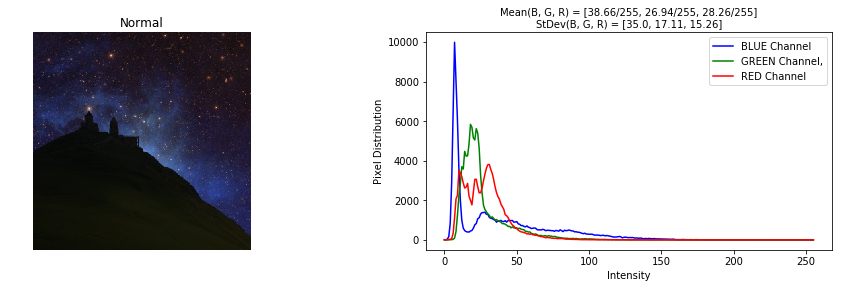

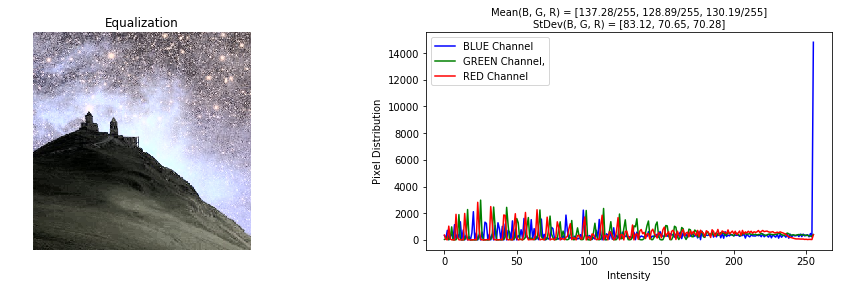

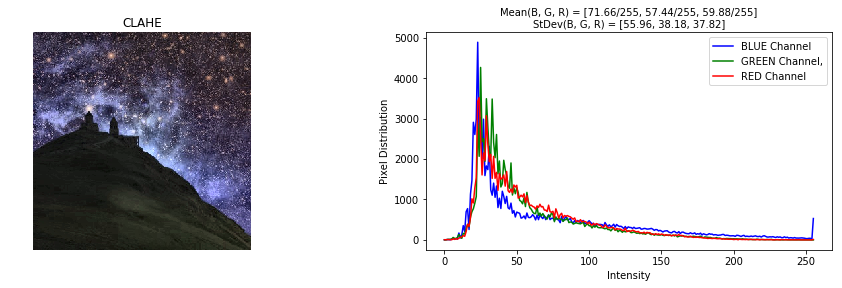

In [27]:
create_color_hist(img3, title="Normal")
create_color_hist(equalizeHist_rgb(img3), title="Equalization")
create_color_hist(clahe_rgb(img3, clipLimit=5), title="CLAHE")

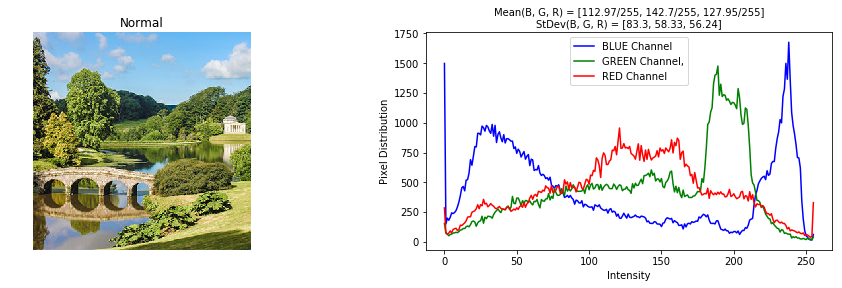

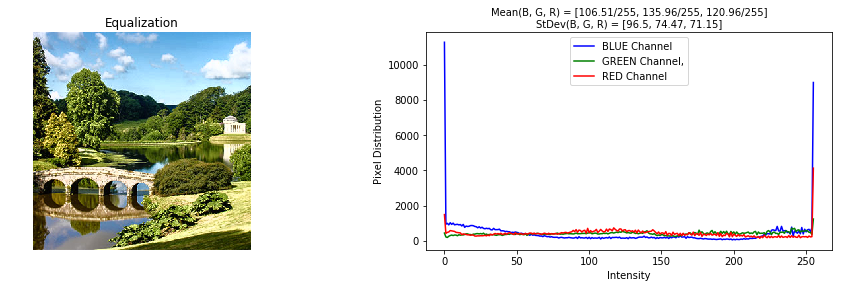

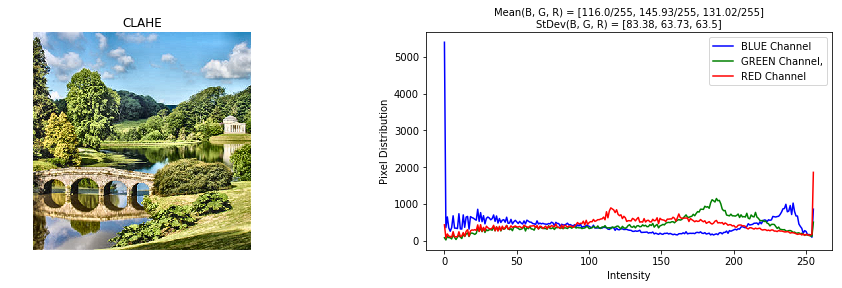

In [28]:
create_color_hist(img2, title="Normal")
create_color_hist(equalizeHist_rgb(img2), title="Equalization")
create_color_hist(clahe_rgb(img2), title="CLAHE")

# [=2] Image Restoration
This step runs **parallel** to *Image Enhancement* (it means, you can do enhancement or restoration *at the same time*, according to its need.

Image restoration aims to **regenerate** an degraded image as close as possible to the real image. An image is called **degraded** if:
$$g(x, y) = H(x, y) * f(x, y) + \eta(x, y)$$
which each component above implies
<br>&emsp; $g(x, y)$ denotes *degraded image*
<br>&emsp; $H(x, y)$ denotes *degradation function*
<br>&emsp; $f(x, y)$ denotes *original image*
<br>&emsp; $\eta(x, y)$ denotes *noise function* (i.e. Gaussian / Gamma / Rayleigh / Exponential / Uniform / Impulse)
<br>and the $*$ operator means *convolution* process.
<br>Therefore, the more we know about $H(x, y)$ and $\eta(x, y)$, the more $\hat{f}(x, y) == f(x, y)$ (estimated image same as original image).

* **Noise Addition**
<br>There are several types of noise according to *Digital Image Processing* book:
<br>&emsp; - Gaussian
<br>&emsp; - Rayleigh
<br>&emsp; - Gamma
<br>&emsp; - Exponential (special case of Gamma)
<br>&emsp; - Uniform
<br>&emsp; - Impulse / Salt-and-Pepper / Shot-and-Spike
<br>Within [Scikit-Image library](https://scikit-image.org/docs/dev/api/skimage.util.html#skimage.util.random_noise) itself, there are other types:
<br>&emsp; - Local Variance (special case of Gaussian)
<br>&emsp; - Poission
<br>&emsp; - Speckle
<br>However in this code, only ***Impulse*** and ***Gaussian*** noise are covered.

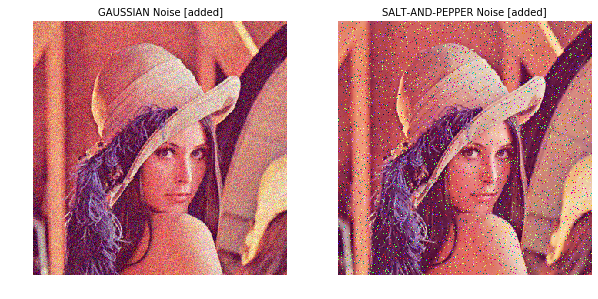

In [29]:
noise_fig = plt.figure(figsize=(10, 5)) # figsize(width/horizontally, height/vertically)

m = noise_fig.add_subplot(121)
# since skimage.util.random_noise will return float64-typed image
# which is unsuitable for plt.imshow(), convert it to float32 first
gaussian_noise_img = float32(rn(img, mode='gaussian'))
plot_image(gaussian_noise_img, title="GAUSSIAN Noise [added]")

n = noise_fig.add_subplot(122)
saltpepper_noise_img = float32(rn(img, mode='s&p'))
plot_image(saltpepper_noise_img, title="SALT-AND-PEPPER Noise [added]")

* **Filtering**
<br>Types:
<br>&emsp; - **Lowpass Filter** (for noise reduction and image smoothing)
<br>&emsp; - **Highpass Filter** (for edge detection)
<br>&emsp; - **Bandpass Filter** (for edge sharpening)

* **Lowpass Filter: IMAGE SMOOTHING**
<br>Henceforward about [Highpass Filter]() and [Bandpass Filter]()

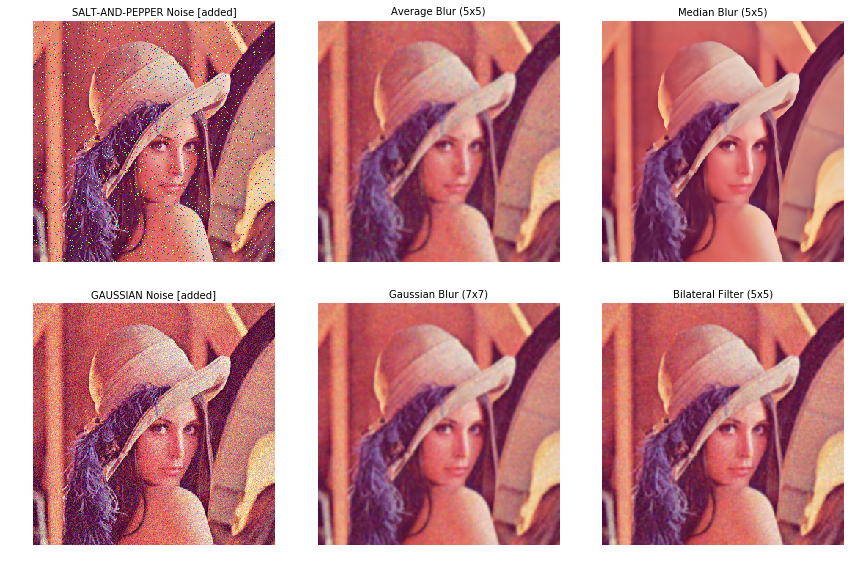

In [30]:
lowpass_names = [
    "SALT-AND-PEPPER Noise [added]",
    "Average Blur (5x5)",
    "Median Blur (5x5)",
    "GAUSSIAN Noise [added]",
    "Gaussian Blur (7x7)",
    "Bilateral Filter (5x5)"
] # will be set as title for each image

lowpass_img_fig = plt.figure(figsize=(12, 8)) # figsize(width/horizontally, height/vertically)
lowpass_img = [
    saltpepper_noise_img, # salt-and-pepper noise added
    cv2.blur(saltpepper_noise_img, (5, 5)), # (5, 5) is the kernel matrix
    cv2.medianBlur(saltpepper_noise_img, 5), # highly effective in removing salt-and-pepper noise
    gaussian_noise_img, # Gaussian noise added
    cv2.GaussianBlur(gaussian_noise_img, (7, 7), 0),
    cv2.bilateralFilter(gaussian_noise_img, 5, 60, 60) # highly effective at noise removal while preserving edges
]

for i in range(len(lowpass_img)):
    b = lowpass_img_fig.add_subplot(2, 3, i+1) # position index always starts from 1, thus i+1
    plot_image(lowpass_img[i], title=lowpass_names[i])
plt.tight_layout() # margin adjusted

In [31]:
def blur_img(img, k=5): # manual blur function
    kernel = ones((k, k), float32) / (k*k)
    return cv2.filter2D(img, -1, kernel) # -1 means the output depth is the same as the source

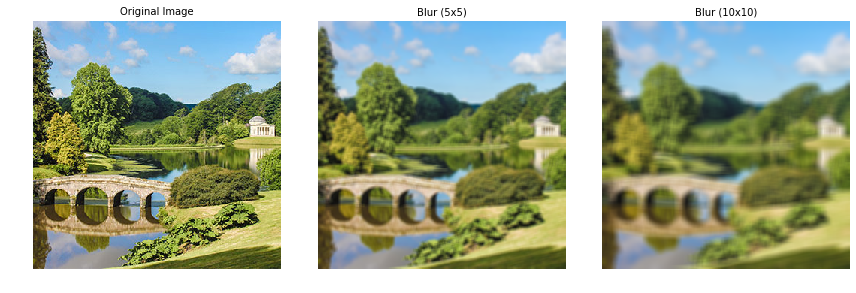

In [32]:
manual_blur_names = ["Original Image", "Blur (5x5)", "Blur (10x10)"] # will be set as title for each image
manual_blur_fig = plt.figure(figsize=(12, 4)) # figsize(width/horizontally, height/vertically)
manual_blur_img = [img2, blur_img(img2), blur_img(img2, k=10)]

for i in range(len(manual_blur_img)):
    x = manual_blur_fig.add_subplot(1, 3, i+1) # position index always starts from 1, thus i+1
    plot_image(manual_blur_img[i], title=manual_blur_names[i])
plt.tight_layout() # margin adjusted

# [3] Color Image Processing

![ColorRGB](img/rgb.png)

In [33]:
# List of all available CV2 color conversions
[i for i in dir(cv2) if i.startswith('COLOR_')]

['COLOR_BAYER_BG2BGR',
 'COLOR_BAYER_BG2BGRA',
 'COLOR_BAYER_BG2BGR_EA',
 'COLOR_BAYER_BG2BGR_VNG',
 'COLOR_BAYER_BG2GRAY',
 'COLOR_BAYER_BG2RGB',
 'COLOR_BAYER_BG2RGBA',
 'COLOR_BAYER_BG2RGB_EA',
 'COLOR_BAYER_BG2RGB_VNG',
 'COLOR_BAYER_GB2BGR',
 'COLOR_BAYER_GB2BGRA',
 'COLOR_BAYER_GB2BGR_EA',
 'COLOR_BAYER_GB2BGR_VNG',
 'COLOR_BAYER_GB2GRAY',
 'COLOR_BAYER_GB2RGB',
 'COLOR_BAYER_GB2RGBA',
 'COLOR_BAYER_GB2RGB_EA',
 'COLOR_BAYER_GB2RGB_VNG',
 'COLOR_BAYER_GR2BGR',
 'COLOR_BAYER_GR2BGRA',
 'COLOR_BAYER_GR2BGR_EA',
 'COLOR_BAYER_GR2BGR_VNG',
 'COLOR_BAYER_GR2GRAY',
 'COLOR_BAYER_GR2RGB',
 'COLOR_BAYER_GR2RGBA',
 'COLOR_BAYER_GR2RGB_EA',
 'COLOR_BAYER_GR2RGB_VNG',
 'COLOR_BAYER_RG2BGR',
 'COLOR_BAYER_RG2BGRA',
 'COLOR_BAYER_RG2BGR_EA',
 'COLOR_BAYER_RG2BGR_VNG',
 'COLOR_BAYER_RG2GRAY',
 'COLOR_BAYER_RG2RGB',
 'COLOR_BAYER_RG2RGBA',
 'COLOR_BAYER_RG2RGB_EA',
 'COLOR_BAYER_RG2RGB_VNG',
 'COLOR_BGR2BGR555',
 'COLOR_BGR2BGR565',
 'COLOR_BGR2BGRA',
 'COLOR_BGR2GRAY',
 'COLOR_BGR2HLS',
 'COLO

# [4] Wavelets and Multiresolution Processing

# [5] Image Compression

In [34]:
# cv2.imwrite('compress_img.png', img,  [cv2.IMWRITE_PNG_COMPRESSION])

# [6] Morphological Image Processing
These are many of common structure elements used for **Morphological Operations** (for *binary image* in general, but it seems can be applied also for grayscale or color image). <font color="red">You can create your own, with free-sized kernel.</font> Only three (marked by \*) of them are available through **cv2.getStructuringElement()**, with **cv2.MORPH_RECT** or **cv2.MORPH_ELLIPSE** or **cv2.MORPH_CROSS** as its parameter within.

| <center>Rectangular/Box* | <center>Elliptical* | <center>Cross* | <center>Chessboard |
| --- | --- | --- | --- |
| $\begin{bmatrix} 1 & 1 & 1 & 1 & 1 \\ 1 & 1 & 1 & 1 & 1 \\ 1 & 1 & 1 & 1 & 1 \\ 1 & 1 & 1 & 1 & 1 \\ 1 & 1 & 1 & 1 & 1\end{bmatrix}$ |  $\begin{bmatrix} 0 & 0 & 1 & 0 & 0 \\ 1 & 1 & 1 & 1 & 1 \\ 1 & 1 & 1 & 1 & 1 \\ 1 & 1 & 1 & 1 & 1 \\ 0 & 0 & 1 & 0 & 0\end{bmatrix}$ | $\begin{bmatrix} 0 & 0 & 1 & 0 & 0 \\ 0 & 0 & 1 & 0 & 0 \\ 1 & 1 & 1 & 1 & 1 \\ 0 & 0 & 1 & 0 & 0 \\ 0 & 0 & 1 & 0 & 0 \end{bmatrix}$ | $\begin{bmatrix} 1 & 0 & 1 & 0 & 1 \\ 0 & 1 & 0 & 1 & 0 \\ 1 & 0 & 1 & 0 & 1 \\ 0 & 1 & 0 & 1 & 0 \\ 1 & 0 & 1 & 0 & 1 \end{bmatrix}$ |

| <center>Center-Vertical | <center>Center-Horizontal | <center>Right-Diagonal | <center>Left-Diagonal |
| --- | --- | --- | --- |
| $\begin{bmatrix} 0 & 0 & 1 & 0 & 0 \\ 0 & 0 & 1 & 0 & 0 \\ 0 & 0 & 1 & 0 & 0 \\ 0 & 0 & 1 & 0 & 0 \\ 0 & 0 & 1 & 0 & 0\end{bmatrix}$ | $\begin{bmatrix} 0 & 0 & 0 & 0 & 0 \\ 0 & 0 & 0 & 0 & 0 \\ 1 & 1 & 1 & 1 & 1 \\ 0 & 0 & 0 & 0 & 0 \\ 0 & 0 & 0 & 0 & 0 \end{bmatrix}$ | $\begin{bmatrix} 0 & 0 & 0 & 0 & 1 \\ 0 & 0 & 0 & 1 & 0 \\ 0 & 0 & 1 & 0 & 0 \\ 0 & 1 & 0 & 0 & 0 \\ 1 & 0 & 0 & 0 & 0 \end{bmatrix}$ | $\begin{bmatrix} 1 & 0 & 0 & 0 & 0 \\ 0 & 1 & 0 & 0 & 0 \\ 0 & 0 & 1 & 0 & 0 \\ 0 & 0 & 0 & 1 & 0 \\ 0 & 0 & 0 & 0 & 1 \end{bmatrix}$ |

In [35]:
_, binary_shape = cv2.threshold(cv2.imread("img/shape2.png", 0), 127, 255, cv2.THRESH_BINARY)
_, binary_paw = cv2.threshold(cv2.imread("img/paw.png", 0), 127, 255, cv2.THRESH_BINARY)
_, binary_raptor = cv2.threshold(cv2.imread("img/raptor.png", 0), 127, 255, cv2.THRESH_BINARY)

<font color="red"><b>TO BE NOTICE</b></font>
<br>Even **CV2** provides binary image conversion using **cv2.threshold()** and therefore generate a black-and-white image, its array never contains 0 (False) or 1 (True), but 0 (black) or 255 (white). And to use **skimage.morphology()** functions, arrays must contain only **0 (False) or 1 (True)**.

In [36]:
copy_raptor = binary_raptor
copy_raptor[copy_raptor == 255] = 1 # change 255 (white) value to 1 (True)

skeletonized_raptor = skeletonize(copy_raptor) # Skeletonization
convex_hulled_raptor = convex_hull_image(copy_raptor) # Convex Hull
boundary_extracted_raptor = copy_raptor - binary_erosion(copy_raptor) # Boundary Extraction

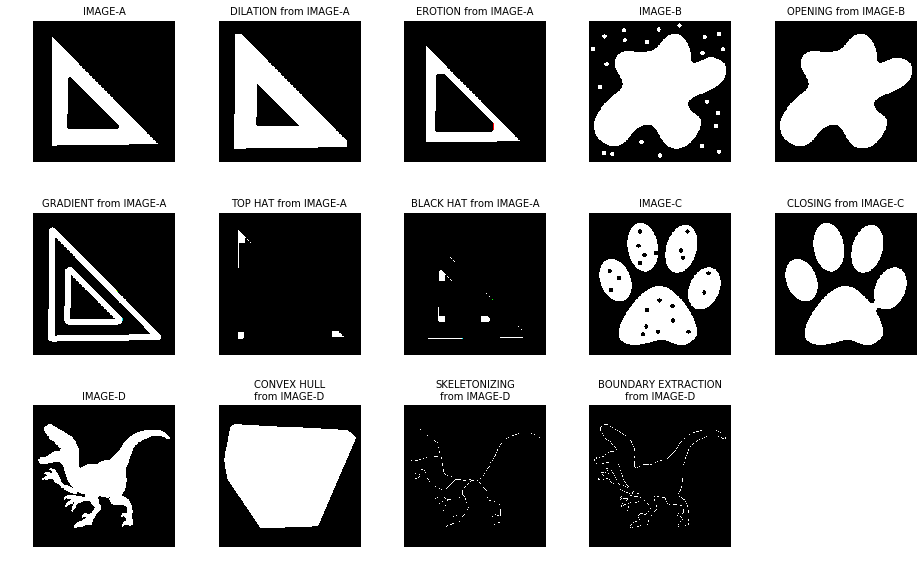

In [37]:
morph_names = [
    "IMAGE-A",
    "DILATION from IMAGE-A", 
    "EROTION from IMAGE-A",
    "IMAGE-B",
    "OPENING from IMAGE-B",
    "GRADIENT from IMAGE-A",
    "TOP HAT from IMAGE-A",
    "BLACK HAT from IMAGE-A",
    "IMAGE-C",
    "CLOSING from IMAGE-C",
    "IMAGE-D",
    "CONVEX HULL\nfrom IMAGE-D",
    "SKELETONIZING\nfrom IMAGE-D",
    "BOUNDARY EXTRACTION\nfrom IMAGE-D"
] # will be set as title for each image

struct_element = [ # options of structure elements
    cv2.getStructuringElement(cv2.MORPH_RECT, (15, 15)), # rectangle
    cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (15, 15)), # ellipse
    cv2.getStructuringElement(cv2.MORPH_CROSS, (30, 30)) # cross-shaped
]

morph_img = [
    cv2.bitwise_not(binary_triangle), # first original image
    cv2.dilate(cv2.bitwise_not(binary_triangle), struct_element[0], iterations=1), # dilation of first image
    cv2.erode(cv2.bitwise_not(binary_triangle), struct_element[0], iterations=1), # erodion of first image
    binary_shape, # second original image
    cv2.morphologyEx(binary_shape, cv2.MORPH_OPEN, struct_element[0]), # opening of second image
    cv2.morphologyEx(cv2.bitwise_not(binary_triangle), cv2.MORPH_GRADIENT, struct_element[1]), # gradient morph of first image
    cv2.morphologyEx(cv2.bitwise_not(binary_triangle), cv2.MORPH_TOPHAT, struct_element[2]), # tophat morphe of first image
    cv2.morphologyEx(cv2.bitwise_not(binary_triangle), cv2.MORPH_BLACKHAT, struct_element[2]), # blackhat morphe of first image
    binary_paw, # third original image
    cv2.morphologyEx(binary_paw, cv2.MORPH_CLOSE, struct_element[1]), # closing of third image
    binary_raptor, # fourth original image
    convex_hulled_raptor, # convex hull of fourth image
    skeletonized_raptor, # skeletonization of fourth image
    boundary_extracted_raptor # boundary extraction of fourth image
]

morph_fig = plt.figure(figsize=(13, 8)) # figsize(width/horizontally, height/vertically)
for i in range(len(morph_img)):
    m = morph_fig.add_subplot(3, 5, i+1) # position index always starts from 1, thus i+1
    
    if i < 10:
        plot_image(morph_img[i], title=morph_names[i])
    else:
        # show of morphed image through skimage.morphology() doesn't need to be color-converted through my
        # user-defined plot_image() function, since it already contains 0 (black/False) and 1 (white/True) values
        plt.imshow(morph_img[i], "gray")
        plt.title(morph_names[i], size=10)
        plt.axis("off")
plt.tight_layout() # margin adjusted

# [7] Image Segmentation

* **Blob Detection:** Laplacian of Gaussian, Difference of Gaussian, and Determinant of Hessian

In [38]:
bubbles = cv2.imread("img/bubbles.png")
gray_bubbles = cv2.cvtColor(bubbles, cv2.COLOR_BGR2GRAY)

Any blob function from skimage.feature returns **2D array** with each row representing three values of **(y, x, sigma)** where (y, x) are coordinates of the blob and sigma is the standard deviation of the Gaussian kernel of the Hessian Matrix whose determinant detected the blob.

In [39]:
blobs_LoG = blob_log(gray_bubbles, max_sigma=30, num_sigma=10, threshold=.1)
blobs_LoG[:, 2] = blobs_LoG[:, 2] * sqrt(2)

blobs_DoG = blob_dog(gray_bubbles, max_sigma=30, threshold=.1)
blobs_DoG[:, 2] = blobs_DoG[:, 2] * sqrt(2)

blobs_DoH = blob_doh(gray_bubbles, max_sigma=30, threshold=3e-3)
blobs_DoH[:, 2] = blobs_DoH[:, 2] * sqrt(2)

c:\users\nicholas dominic\appdata\local\programs\python\python37\lib\site-packages\skimage\feature\blob.py:125: RuntimeWarning: invalid value encountered in double_scalars
  r1 = blob1[-1] / blob2[-1]
c:\users\nicholas dominic\appdata\local\programs\python\python37\lib\site-packages\skimage\feature\blob.py:126: RuntimeWarning: divide by zero encountered in true_divide
  pos1 = blob1[:ndim] / (max_sigma * root_ndim)
c:\users\nicholas dominic\appdata\local\programs\python\python37\lib\site-packages\skimage\feature\blob.py:127: RuntimeWarning: divide by zero encountered in true_divide
  pos2 = blob2[:ndim] / (max_sigma * root_ndim)
c:\users\nicholas dominic\appdata\local\programs\python\python37\lib\site-packages\skimage\feature\blob.py:129: RuntimeWarning: invalid value encountered in subtract
  d = np.sqrt(np.sum((pos2 - pos1)**2))


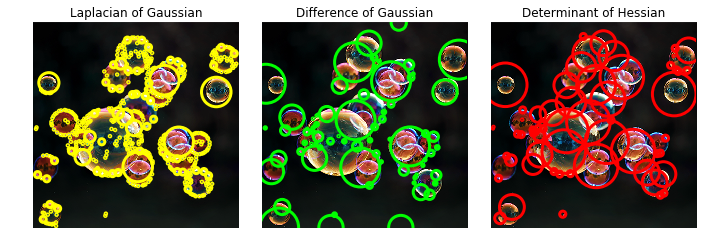

In [40]:
blobs_list = [blobs_LoG, blobs_DoG, blobs_DoH]
colors = ['yellow', 'lime', 'red']
titles = ['Laplacian of Gaussian', 'Difference of Gaussian', 'Determinant of Hessian']
sequence = zip(blobs_list, colors, titles)

fig, axes = plt.subplots(1, 3, figsize=(10, 5), sharex=True, sharey=True)
ax = axes.ravel()

for idx, (blobs, color, title) in enumerate(sequence):
    ax[idx].set_title(title)
    ax[idx].imshow(bubbles)
    for blob in blobs:
        y, x, r = blob
        c = plt.Circle((x, y), r, color=color, linewidth=3, fill=False)
        ax[idx].add_patch(c)
    ax[idx].set_axis_off()

plt.tight_layout()

* **Line Detection**

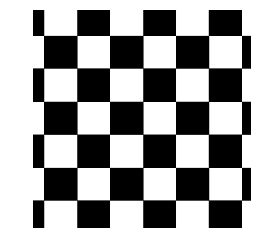

In [41]:
chessboard = cv2.imread("img/chessboard.png")
plot_image(chessboard)

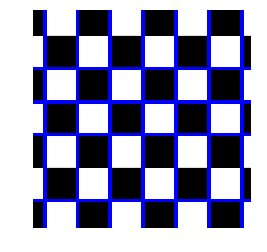

In [42]:
edges = cv2.Canny(chessboard, 50, 150, apertureSize=3)
chessboard_lines = chessboard.copy()

try:
        # cv2.HoughLines(image, rho, theta, threshold)
        # 'rho' means distance resolution in pixels
        # 'theta' means angle resolution in radians
    lines = cv2.HoughLines(edges, 1, pi/180, 200)
    for line in lines:
        rho, theta = line[0]
        a = cos(theta)
        b = sin(theta)
        x0 = a*rho
        y0 = b*rho
        x1 = int(x0 + 1000*(-b))
        y1 = int(y0 + 1000*(a))
        x2 = int(x0 - 1000*(-b))
        y2 = int(y0 - 1000*(a))
        
        # cv2.line(image, point1, point2, colorBGR, thickness)
        cv2.line(chessboard_lines, (x1, y1), (x2, y2), (255, 0, 0), 5)

    plot_image(chessboard_lines)
except Exception as ex: # use try-except since cv2.HoughLines will return None if there's no line detected
    print("There's no line detected in this image.")

* **Highpass Filter: EDGE DETECTION**
<br>See also [**Lowpass Filter**]() for image smoothing and [**Bandpass Filter**]() for edge sharpening.

Some of **manual edge detection** require its cv2.CV_64F-typed image result to be converted into uint8 type. See why and how [here](https://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_imgproc/py_gradients/py_gradients.html#one-important-matter).

In [43]:
def edge_detection(img, operator="sobel", laplace_type=0, canny_threshold=[50, 70]):
    if operator == "sobel":
        x_kernel = array([[-1,  0,  1],
                          [-2,  0,  2],
                          [-1,  0,  1]])
        y_kernel = array([[-1, -2, -1],
                          [ 0,  0,  0],
                          [ 1,  2,  1]])
        x_sobel = cv2.filter2D(img, cv2.CV_64F, x_kernel)
        y_sobel = cv2.filter2D(img, cv2.CV_64F, y_kernel)
        return uint8(sqrt((abs(x_sobel) ** 2) + (abs(y_sobel) ** 2))) # convert the result into uint8 type
        
    elif operator == "roberts":
        x_kernel = array([[ 1,  0],
                          [ 0, -1]])
        y_kernel = array([[ 0,  1],
                          [-1,  0]])
        x_roberts = cv2.filter2D(img, cv2.CV_64F, x_kernel)
        y_roberts = cv2.filter2D(img, cv2.CV_64F, y_kernel)
        return uint8(sqrt((abs(x_roberts) ** 2) + (abs(y_roberts) ** 2))) # convert the result into uint8 type
    
    elif operator == "prewitt":
        x_kernel = array([[-1, 0, 1],
                          [-1, 0, 1],
                          [-1, 0, 1]])
        y_kernel = array([[-1, -1, -1],
                          [ 0,  0,  0],
                          [ 1,  1,  1]])
        x_prewitt = cv2.filter2D(img, cv2.CV_64F, x_kernel)
        y_prewitt = cv2.filter2D(img, cv2.CV_64F, y_kernel)
        return uint8(sqrt((abs(x_prewitt) ** 2) + (abs(y_prewitt) ** 2))) # convert the result into uint8 type
    
    elif operator == "laplace":
        if laplace_type == 0:
            kernel = array([[0,  1, 0],
                            [1, -4, 1],
                            [0,  1, 0]])
        elif laplace_type == 1:
            kernel = array([[-1, -1, -1],
                            [-1,  8, -1],
                            [-1, -1, -1]])
        elif laplace_type == 2:
            kernel = array([[ 1, -2,  1],
                            [-2,  4, -2],
                            [ 1, -2,  1]])
        elif laplace_type == 3: # Laplacian of Gaussian (LoG)
             kernel = array([[ 0,  0, -1,  0,  0],
                             [ 0, -1, -2, -1,  0],
                             [-1, -2, 16, -2, -1],
                             [ 0, -1, -2, -1,  0],
                             [ 0,  0, -1,  0,  0]])
        else:
            raise AttributeError("Sorry! There's no such type of Laplacian edge detector as \"{}\". Alternatively, create your own kernel matrix and do with cv2.filter2D() instead.".format(laplace_type))     
        return cv2.filter2D(img, -1, kernel)
        
    elif operator == "kirsch":
        w_kernel = array([[5, -3, -3],
                          [5,  0, -3],
                          [5, -3, -3]]) # West
        nw_kernel = array([[ 5,  5, -3],
                           [ 5,  0, -3],
                           [-3, -3, -3]]) # North-West
        n_kernel = array([[ 5,  5,  5],
                          [-3,  0, -3],
                          [-3, -3, -3]]) # North
        ne_kernel = array([[-3,  5,  5],
                           [-3,  0,  5],
                           [-3, -3, -3]]) # North-East
        sw_kernel = array([[-3, -3, -3],
                           [ 5,  0, -3],
                           [ 5,  5, -3]]) # South-West
        s_kernel = array([[-3, -3, -3],
                          [-3,  0, -3],
                          [ 5,  5,  5]]) # South
        se_kernel = array([[-3, -3, -3],
                           [-3,  0,  5],
                           [-3,  5,  5]]) # South-East
        e_kernel = array([[-3, -3, 5],
                          [-3,  0, 5],
                          [-3, -3, 5]]) # East
        
        kirschW = cv2.filter2D(img, cv2.CV_64F, w_kernel)
        kirschNW = cv2.filter2D(img, cv2.CV_64F, nw_kernel)
        kirschN = cv2.filter2D(img, cv2.CV_64F, n_kernel)
        kirschNE = cv2.filter2D(img, cv2.CV_64F, ne_kernel)
        kirschSW = cv2.filter2D(img, cv2.CV_64F, sw_kernel)
        kirschS = cv2.filter2D(img, cv2.CV_64F, s_kernel)
        kirschSE = cv2.filter2D(img, cv2.CV_64F, se_kernel)
        kirschE = cv2.filter2D(img, cv2.CV_64F, e_kernel)
        
        kirsch_1 = amax([kirschW, amax([kirschNW, amax([kirschN, kirschNE], axis=0)], axis=0)], axis=0)
        kirsch_2 = amax([kirschSW, amax([kirschS, amax([kirschSE, kirschE], axis=0)], axis=0)], axis=0)
        return uint8(amax([kirsch_1, kirsch_2], axis=0))

    else:
        raise AttributeError("Sorry! There's no such edge detection operator type as \"{}\". Alternatively, create your own kernel matrix and do with cv2.filter2D() instead.".format(operator))

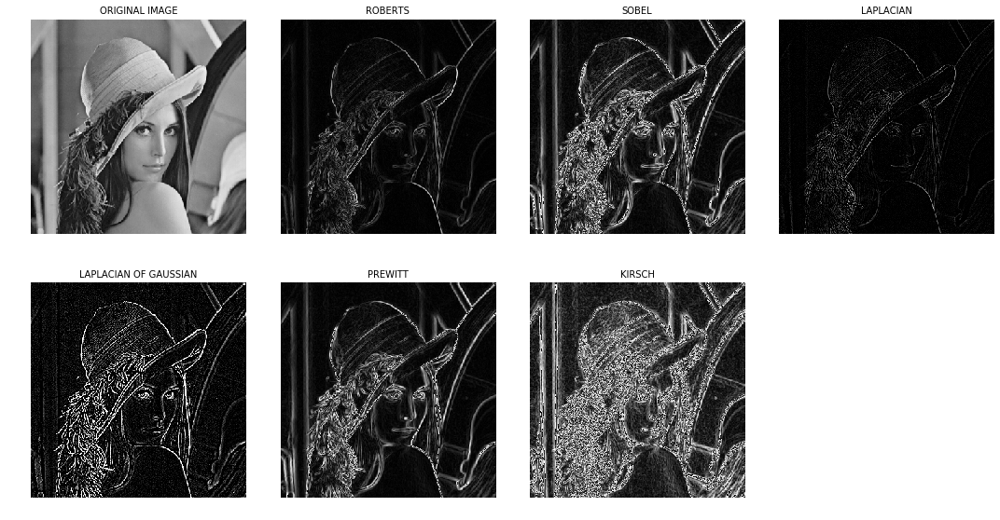

In [44]:
edge_names = ["ORIGINAL IMAGE", "ROBERTS", "SOBEL", "LAPLACIAN", "LAPLACIAN OF GAUSSIAN", "PREWITT", "KIRSCH"] # will be set as title for each image
edge_img_fig = plt.figure(figsize=(15, 8)) # figsize(width/horizontally, height/vertically)
edge_img = [
    img_grayscaled, # original image
    edge_detection(img_grayscaled, operator="roberts"), 
    edge_detection(img_grayscaled, operator="sobel"), 
    edge_detection(img_grayscaled, operator="laplace", laplace_type=0), 
    edge_detection(img_grayscaled, operator="laplace", laplace_type=3), 
    edge_detection(img_grayscaled, operator="prewitt"), 
    edge_detection(img_grayscaled, operator="kirsch")
]

for i in range(len(edge_img)):
    t = edge_img_fig.add_subplot(2, 4, i+1) # position index always starts from 1, thus i+1
    plot_image(edge_img[i], title=edge_names[i])
plt.tight_layout() # margin adjusted

Some of **built-in edge detection function** from OpenCV2.

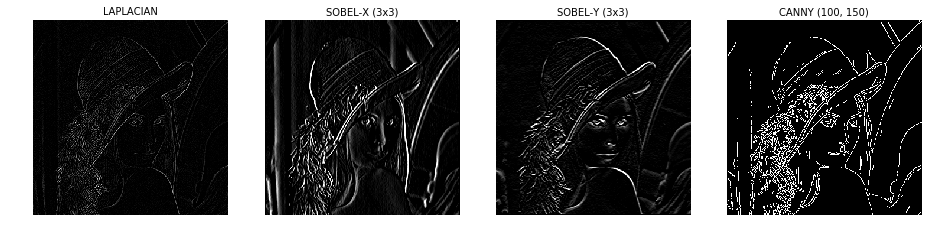

In [45]:
edge2_names = ["LAPLACIAN", "SOBEL-X (3x3)", "SOBEL-Y (3x3)", "CANNY (100, 150)"] # will be set as title for each image
edge2_img_fig = plt.figure(figsize=(13, 4)) # figsize(width/horizontally, height/vertically)
edge2_img = [
    cv2.Laplacian(img_grayscaled, -1),
    cv2.Sobel(img_grayscaled, -1, 1, 0, ksize=3),
    cv2.Sobel(img_grayscaled, -1, 0, 1, ksize=3),
    cv2.Canny(img_grayscaled, threshold1=100, threshold2=150)
]

for i in range(len(edge2_img)):
    u = edge2_img_fig.add_subplot(1, 4, i+1) # position index always starts from 1, thus i+1
    plot_image(edge2_img[i], title=edge2_names[i])
plt.tight_layout() # margin adjusted

* **Bandpass Filter: EDGE SHARPENING**
<br>See also [**Lowpass Filter**]() for image smoothing and [**Highpass Filter**]() for edge detection.

In [46]:
def sharpening(img, type_=0, kernel=None):
    if type_ == 0:
        kernel = array([[-1, -1, -1],
                        [-1,  9, -1],
                        [-1, -1, -1]])
    elif type_ == 1:
        kernel = array([[ 0, -1,  0],
                        [-1,  5, -1],
                        [ 0, -1,  0]])
    elif type_ == 2:
        kernel = array([[ 1, -2,  1],
                        [-2,  5, -2],
                        [ 1, -2,  1]])
    else:
        if kernel is not None:
            kernel = array(kernel)
        else:
            raise ValueError("Please choose available type_ or drop your own sharpening matrix on kernel parameter.")
    
    return cv2.filter2D(img, -1, kernel)

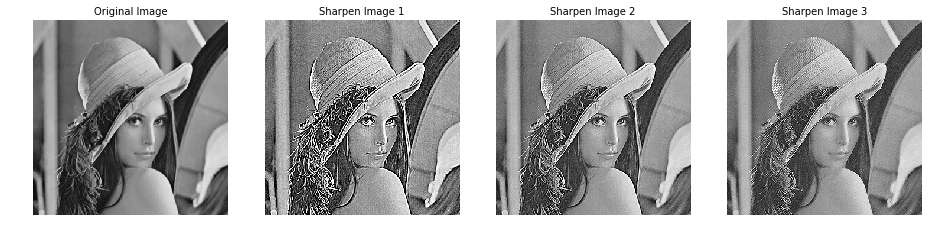

In [47]:
sharpen_names = ["Original Image", "Sharpen Image"] # will be set as title for each image
sharpen_fig = plt.figure(figsize=(13, 4)) # figsize(width/horizontally, height/vertically)
sharpen_img = [img_grayscaled, sharpening(img_grayscaled), sharpening(img_grayscaled, type_=1), sharpening(img_grayscaled, type_=2)]

for i in range(len(sharpen_img)):
    s = sharpen_fig.add_subplot(1, 4, i+1) # position index always starts from 1, thus i+1
    plot_image(sharpen_img[i], title=sharpen_names[0] if i == 0 else sharpen_names[1] + " " + str(i))
plt.tight_layout() # margin adjusted

* **Corner Detection:** Harris / FAST / ORB

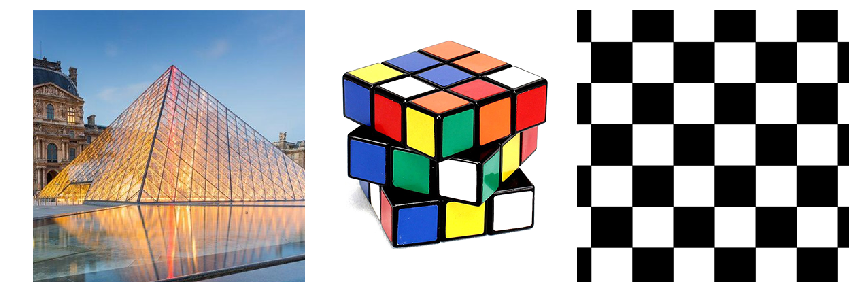

In [48]:
louvre = cv2.imread("img/louvre.png")
rubik = cv2.imread("img/rubik.png")

# combine three images above
img5 = concatenate((concatenate((louvre, rubik), axis=1), chessboard), axis=1)
plt.figure(figsize=(15, 5))
plot_image(img5)

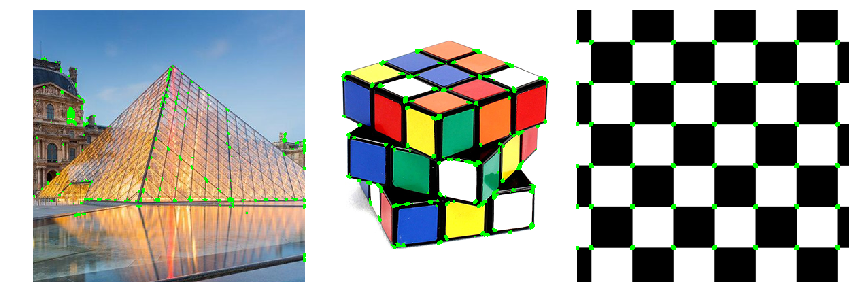

In [49]:
# using cv2.cornerHarris()
img5_grayscaled = cv2.cvtColor(img5, cv2.COLOR_BGR2GRAY)
img5_corner = cv2.cornerHarris(src=float32(img5_grayscaled), blockSize=5, ksize=3, k=1e-3)

img5_result = img5.copy()
img5_result[img5_corner > .01 * img5_corner.max()] = [0, 255, 0] # [Blue, Green, Red] == [255, 255, 255]

plt.figure(figsize=(15, 5))
plot_image(img5_result)

In [50]:
# using skimage.feature.corner_harris()
louvre_corner = corner_harris(cv2.cvtColor(louvre, cv2.COLOR_BGR2GRAY), k=.08)
louvre_result = louvre.copy()
louvre_result[louvre_corner > .01 * louvre_corner.max()] = [0, 255, 0] # [Blue, Green, Red] == [255, 255, 255]

In [51]:
fast = cv2.FastFeatureDetector_create(threshold=50)
fast_keypoints_rubik = fast.detect(rubik, None)
fast_result_rubik = rubik.copy()
cv2.drawKeypoints(rubik, fast_keypoints_rubik, fast_result_rubik, [0, 255, 0])

array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]

In [52]:
orb = cv2.ORB_create()
orb_keypoints_chessboard = orb.detect(chessboard, None)
orb_result_chessboard = chessboard.copy()
cv2.drawKeypoints(chessboard, orb_keypoints_chessboard, orb_result_chessboard, [0, 255, 0])

array([[[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]

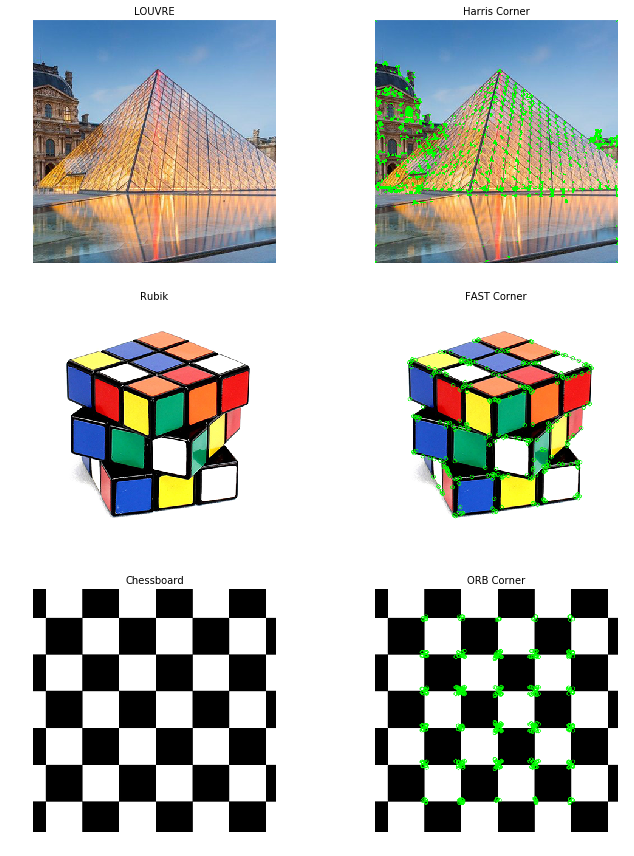

In [53]:
corner_names = ["LOUVRE", "Harris Corner", "Rubik", "FAST Corner", "Chessboard", "ORB Corner"] # will be set as title for each image
corner_fig = plt.figure(figsize=(10, 12)) # figsize(width/horizontally, height/vertically)
corner_img = [
    louvre, louvre_result,
    rubik, fast_result_rubik,
    chessboard, orb_result_chessboard
]

for i in range(len(corner_img)):
    c = corner_fig.add_subplot(3, 2, i+1) # position index always starts from 1, thus i+1
    plot_image(corner_img[i], title=corner_names[i])
plt.tight_layout() # margin adjusted

* **Low-level Image Segmentation:** Felzenszwalb’s (2004), Quickshift (2008), Simple Linear Iterative Clustering (SLIC, 2012), Compact Watershed (2014)

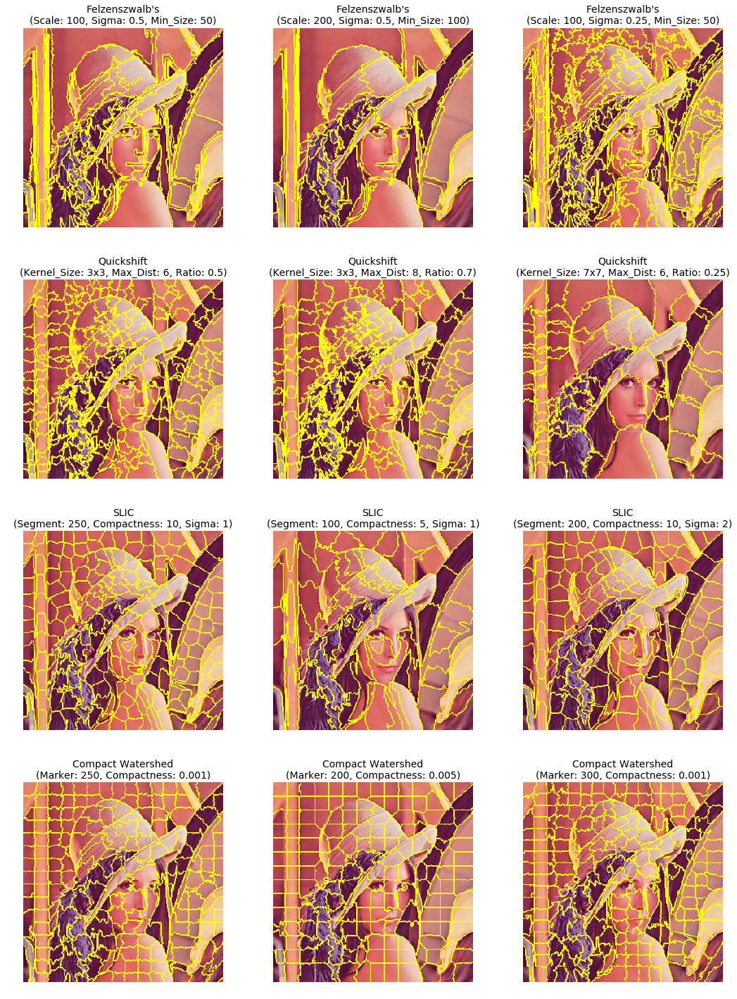

In [54]:
# Segmentation parameters
fz_scale, fz_sigma, fz_min = [100, 200, 100], [.5, .5, .25], [50, 100, 50]
qs_kernel, qs_dist, qs_ratio = [3, 3, 7], [6, 8, 6], [.5, .7, .25]
slic_segment, slic_compact, slic_sigma = [250, 100, 200], [10, 5, 10], [1, 1, 2]
ws_marker, ws_compact = [250, 200, 300], [1e-3, 5e-3, 1e-3] # [0.001, 0.005, 0.001]

segment_names = ["Felzenszwalb's", "Quickshift", "SLIC", "Compact Watershed"] # will be set as title for each image
segment_fig = plt.figure(figsize=(15, 20)) # figsize(width/horizontally, height/vertically)
segment_img = [
    felzenszwalb(img, scale=fz_scale[0], sigma=fz_sigma[0], min_size=fz_min[0]),
    felzenszwalb(img, scale=fz_scale[1], sigma=fz_sigma[1], min_size=fz_min[1]),
    felzenszwalb(img, scale=fz_scale[2], sigma=fz_sigma[2], min_size=fz_min[2]),
    quickshift(img, kernel_size=qs_kernel[0], max_dist=qs_dist[0], ratio=qs_ratio[0]),
    quickshift(img, kernel_size=qs_kernel[1], max_dist=qs_dist[1], ratio=qs_ratio[1]),
    quickshift(img, kernel_size=qs_kernel[2], max_dist=qs_dist[2], ratio=qs_ratio[2]),
    slic(img, n_segments=slic_segment[0], compactness=slic_compact[0], sigma=slic_sigma[0], start_label=1),
    slic(img, n_segments=slic_segment[1], compactness=slic_compact[1], sigma=slic_sigma[1], start_label=1),
    slic(img, n_segments=slic_segment[2], compactness=slic_compact[2], sigma=slic_sigma[2], start_label=1),
    watershed(sobel(cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)), markers=250, compactness=1e-3),
    watershed(sobel(cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)), markers=200, compactness=5e-3),
    watershed(sobel(cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)), markers=300, compactness=1e-3)
]

for i in range(len(segment_img)):
    s = segment_fig.add_subplot(4, 3, i+1) # position index always starts from 1, thus i+1
    if i < 3: # set title for Felzenszwalb's segmentation
        plt.title(segment_names[0] + "\n(Scale: {}, Sigma: {}, Min_Size: {})".format(fz_scale[i], fz_sigma[i], fz_min[i]), fontsize=14)
    elif i > 2 and i < 6: # set title for Quickshift segmentation
        plt.title(segment_names[1] + "\n(Kernel_Size: {}x{}, Max_Dist: {}, Ratio: {})".format(qs_kernel[i-3], qs_kernel[i-3], qs_dist[i-3], qs_ratio[i-3]), fontsize=14)
    elif i > 5 and i < 9: # set title for SLIC segmentation
        plt.title(segment_names[2] + "\n(Segment: {}, Compactness: {}, Sigma: {})".format(slic_segment[i-6], slic_compact[i-6], slic_sigma[i-6]), fontsize=14)
    else: # set title for Compact Watershed segmentation
        plt.title(segment_names[3] + "\n(Marker: {}, Compactness: {})".format(ws_marker[i-9], ws_compact[i-9]), fontsize=14)
    plt.axis("off")
    plt.imshow(mark_boundaries(cv2.cvtColor(img, cv2.COLOR_BGR2RGB), segment_img[i]))
plt.tight_layout() # margin adjusted

# [8] Representation and Description

How to calculate **Gradient Magnitude** and **Gradient Direction** of *each pixel*?
<br>Imagine we have this piece of image; we want to calculate the magnitude and direction in pixel **60**:

<center>$\begin{bmatrix} 15 & 15 & 20 \\ 40 & \textbf{60} & 20 \\ 30 & 41 & 80 \end{bmatrix}$ then take a closer look only in x and y direction $\rightarrow \begin{bmatrix} ... & 15 & ... \\ 40 & \textbf{60} & 20 \\ ... & 41 & ... \end{bmatrix}$</center>
    
Calculate the difference in:
* **x-direction** = | 40 - 20 | = 20
* **y-direction** = | 15 - 41 | = 26

Therefore,
* **Gradient Magnitude** = $\sqrt{20^2 + 26^2}$ = 32.802
* **Gradient Direction** = $tan^{-1} (20 / 26)$ = 37.568 degree

For complete explanation of how **Histogram of Gaussian (HoG)** works, visit [this](https://youtu.be/28xk5i1_7Zc) YouTube channel.

In [55]:
hog_descriptor, hog_image = hog(img, orientations=8, pixels_per_cell=(16, 16), cells_per_block=(1, 1), visualize=True, multichannel=True)
hog_descriptor

array([0.37046934, 0.37046934, 0.37046934, ..., 0.04597591, 0.20856359,
       0.23309241])

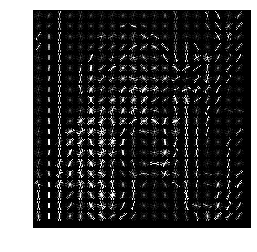

In [56]:
hog_image = exposure.rescale_intensity(hog_image, in_range=(0, 10)) # rescale intensity to clarify the HoG
plot_image(hog_image)

# [9] Object Recognition

* **Image Matching Points** (using SIFT and SURF)

In [57]:
def img_matching(img_object, img_scene, method="SURF"):
    if method == "SURF":    
        surf = cv2.xfeatures2d.SURF_create() # patented for CV2 ver4.0 or above
        keypointsObject, destinationObject = surf.detectAndCompute(img_object, None)
        keypointsScene, destinationScene = surf.detectAndCompute(img_scene, None)
    elif method == "SIFT":
        sift = cv2.xfeatures2d.SIFT_create() # patented for CV2 ver4.0 or above
        keypointsObject, destinationObject = sift.detectAndCompute(img_object, None)
        keypointsScene, destinationScene = sift.detectAndCompute(img_scene, None)
    else:
        raise AttributeError("Sorry! Only SIFT and SURF method are available.")

    destinationObject = destinationObject.astype('f')
    destinationScene = destinationScene.astype('f')

    FLANN_INDEX_KDTREE = 0
    indexParameter = dict(algorithm=FLANN_INDEX_KDTREE)
    searchParameter = dict(check=50)

    flann = cv2.FlannBasedMatcher(indexParameter, searchParameter)
    matches = flann.knnMatch(destinationObject, destinationScene, k=2)

    matches_mask = [[0,0] for i in range (0, len(matches))]
    totalMatch = 0
    
    for i, (m, n) in enumerate(matches):
        # k = 2
        # [1, 0] the most similar
        # [0, 1] similar
        # [0, 0] not similar
        # if k = 3, then [1, 0 ,0] [0, 1, 0] [0, 0, 1] [0, 0, 0]
        if m.distance < 0.7*n.distance:
            matches_mask[i] = [1, 0]
            totalMatch += 1

    result = cv2.drawMatchesKnn(
        img_object, keypointsObject,
        img_scene, keypointsScene,
        matches, None,
        matchColor=[255, 0, 0] if method == "SURF" else [0, 215, 255], # BLUE if SURF and GOLD if SIFT
        singlePointColor=[0, 255, 0] if method == "SURF" else [0, 0, 255], # GREEN if SURF and RED if SIFT
        matchesMask=matches_mask
    )

    plt.figure(figsize=(12, 10))
    plot_image(result, title="Speeded-Up Robust Features (SURF) | Total Matches: {}".format(totalMatch) if method == "SURF"
               else "Scale-Invariant Feature Transform (SIFT) | Total Matches: {}".format(totalMatch), font_size=13)
    plt.axis("off")

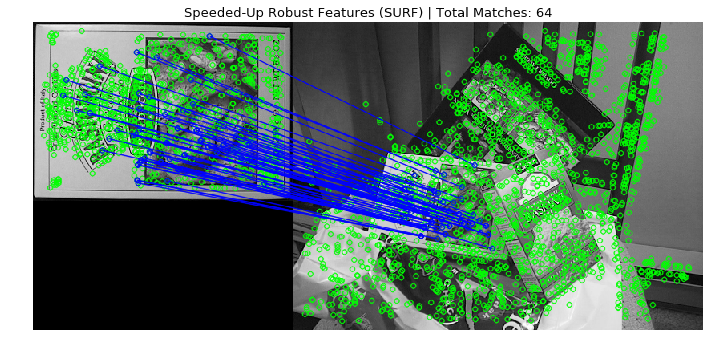

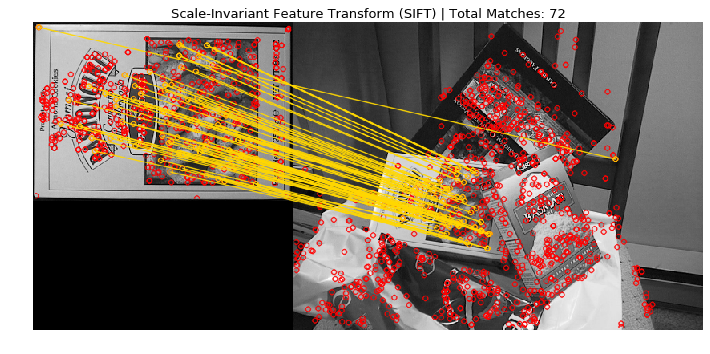

In [58]:
img_matching(cv2.imread("img/box.png"), cv2.imread("img/box_in_scene.png"), method="SURF")
img_matching(cv2.imread("img/box.png"), cv2.imread("img/box_in_scene.png"), method="SIFT")

**SIFT** works better if the scene is transformed. Here's the comparison (see the *Total Matches* in title).

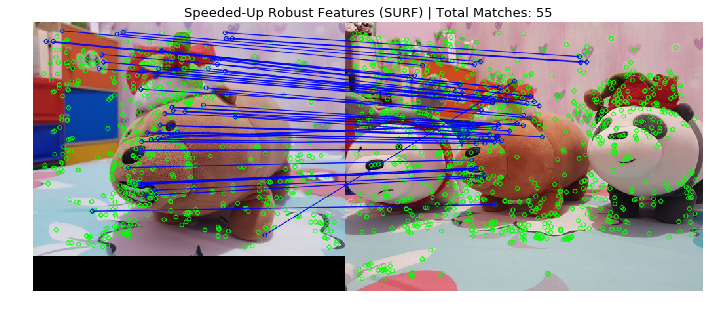

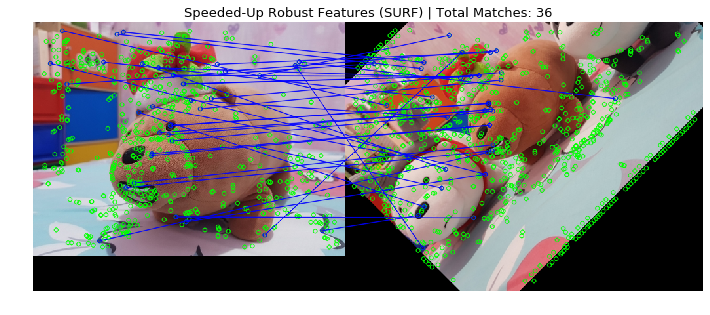

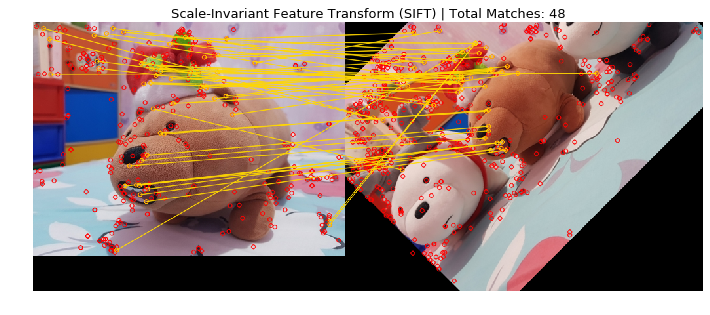

In [59]:
img_matching(cv2.imread("img/bear.jpg"), cv2.imread("img/bear_in_scene.jpg"), method="SURF")
img_matching(cv2.imread("img/bear.jpg"),
             cv2.warpAffine(src=cv2.imread("img/bear_in_scene.jpg"), dsize=None, M=cv2.getRotationMatrix2D((rows/2, cols/2), 45, 1)),
             method="SURF")
img_matching(cv2.imread("img/bear.jpg"),
             cv2.warpAffine(src=cv2.imread("img/bear_in_scene.jpg"), dsize=None, M=cv2.getRotationMatrix2D((rows/2, cols/2), 45, 1)),
             method="SIFT")

* **Real-time Object Detection**

<br><font color="red"><b>TO BE NOTICE</b></font>
<br>**(1)** The code below **further developed** with source reference from this [GitHub](https://github.com/the-javapocalypse/Face-Detection-Recognition-Using-OpenCV-in-Python).
<br><br>**(2)** All functions below **haven't been tested yet** on other devices. Thus **I do not guarantee** this code will work well if, for example, you connect it with a personal webcam, iPad / tab camera, or even a smartphone.
<br><br>**(3)** If you're using:
- Python 3.7.1
- OpenCV v3.4.2
- Windows 10 as Operating System

then you should run this command
> ***setx OPENCV_VIDEOIO_PRIORITY_MSMF 0***

on your cmd (Command Prompt) to **turn off camera after closing CV2 window**; <font color="red">restart</font> your PC then.
<br>It seems **.release()** function has an issue on this version. If there's update in the future about this so you have no problem at all, please ignore this warning.

In [60]:
def generate_dataset(img, id_, img_id):
    cv2.imwrite("train_data/"+id_+"_"+str(img_id)+".jpg", img)

In [61]:
def draw_rect(img, classif, scaleFactor=1.1, minNeighbors=5, minSize=(30, 30), flags=cv2.CASCADE_SCALE_IMAGE, color=(0, 255, 0), text=""):
    features = classif.detectMultiScale(
        cv2.cvtColor(img, cv2.COLOR_BGR2GRAY),
        scaleFactor=scaleFactor,
        minNeighbors=minNeighbors,
        minSize=minSize,
        flags=flags
    )
    
    coordinates = []
    for (x, y, w, h) in features:
        cv2.rectangle(img, (x, y), (x+w, y+h), color, 2)
        cv2.putText(img, text, (x, y-4), cv2.FONT_HERSHEY_SIMPLEX, .8, color, 2, cv2.LINE_AA)
        coordinates = [x, y, w, h]
    
    return coordinates

In [62]:
def live_detect(img, faceCascade, eyeCascade, mouthCascade, noseCascade, ss, img_id, user):
    if faceCascade is not None: # face is ON
        coords = draw_rect(img, faceCascade, text="Face")
        if len(coords) == 4:
            # Updating Region of Interest (roi) by cropping image
            roi_img = img[coords[1]:coords[1]+coords[3], coords[0]:coords[0]+coords[2]]
            
            if ss == 1: # Take a screenshot for generate dataset
                generate_dataset(roi_img, user, img_id) # img_id to make the name of each image unique

            # Passing roi, classifier, scaling factor, Minimum neighbours, color, label text
            if eyeCascade is not None:
                coords = draw_rect(roi_img, eyeCascade, color=(255, 255, 255), text="Eye")
            if mouthCascade is not None:
                coords = draw_rect(roi_img, mouthCascade, color=(255, 255, 0), text="Mouth")
            if noseCascade is not None:
                coords = draw_rect(roi_img, noseCascade, color=(0, 0, 255), text="Nose")
    else: # face is OFF
        if eyeCascade is not None:
            coords = draw_rect(img, eyeCascade, color=(255, 255, 255), text="Eye")
        if mouthCascade is not None:
            coords = draw_rect(img, mouthCascade, color=(255, 255, 0), text="Mouth")
        if noseCascade is not None:
            coords = draw_rect(img, noseCascade, color=(0, 0, 255), text="Nose")
    return img

In [63]:
def start_camera(face="on", eye="off", mouth="off", nose="off", ss=0, user="train_data"):
    if face == "on":
        FACE_CASCADE_PATH = "E:\DATA SCIENCE\Digital Image Processing\cascade\haarcascade_frontalface_default.xml"
        faceCascade = cv2.CascadeClassifier(FACE_CASCADE_PATH)
    elif face == "off":
        faceCascade = None;
    else:
        raise AttributeError("The options are 'on' and 'off' only.")
                             
    if eye == "on":
        EYES_CASCADE_PATH = "E:\DATA SCIENCE\Digital Image Processing\cascade\haarcascade_eye.xml"
        eyeCascade = cv2.CascadeClassifier(EYES_CASCADE_PATH)
    elif eye == "off":
        eyeCascade = None;  
    else:
        raise AttributeError("The options are 'on' and 'off' only.")
    
    if mouth == "on":
        MOUTH_CASCADE_PATH = "E:\DATA SCIENCE\Digital Image Processing\cascade\haarcascade_mouth.xml"
        mouthCascade = cv2.CascadeClassifier(MOUTH_CASCADE_PATH)
    elif mouth == "off":
        mouthCascade = None;
    else:
        raise AttributeError("The options are 'on' and 'off' only.")
    
    if nose == "on":
        NOSE_CASCADE_PATH = "E:\DATA SCIENCE\Digital Image Processing\cascade\haarcascade_nose.xml"
        noseCascade = cv2.CascadeClassifier(NOSE_CASCADE_PATH)
    elif nose == "off":
        noseCascade = None;
    else:
        raise AttributeError("The options are 'on' and 'off' only.")

    # img_id to make the name of each image unique
    if ss == 1:
        img_id = 0
        user = user
    else:
        img_id = None
        user = None
    
    # Start Video Camera
    video_capture = cv2.VideoCapture(0)

    while True:
        ret, frame = video_capture.read() # Capture frame-by-frame
        frame = cv2.flip(frame, 1) # Let camera behaves like a mirror
        frame = resize(frame, width=1000) # Resize window using imutils.resize
        frame = live_detect(frame, faceCascade, eyeCascade, mouthCascade, noseCascade, ss=ss, img_id=img_id, user=user)
            
        # Display the resulting frame
        cv2.imshow('Face Detection (Press Q to Quit)', frame)

        # Increment img_id for face dataset
        if ss == 1:
            img_id += 1
        
        # Press 'q' in keyboard to close the window
        if cv2.waitKey(1) & 0xFF == ord('q'):
            break

    # When everything is done, release the capture
    video_capture.release()
    del(video_capture)
    cv2.destroyAllWindows()

In [64]:
# Try your own configuration
start_camera(face="on", eye="off", mouth="off", nose="on", ss=0)

* **Object Detection** (with % of confidence)

In [65]:
# initialize the list of class labels MobileNet SSD was trained to
# detect, then generate a set of bounding box colors (in random) for each class
CLASSES = ["background", "aeroplane", "bicycle", "bird", "boat",
    "bottle", "bus", "car", "cat", "chair", "cow", "diningtable",
    "dog", "horse", "motorbike", "person", "pottedplant", "sheep",
    "sofa", "train", "tvmonitor"]
COLORS = un(0, 255, size=(len(CLASSES), 3))

def start_camera2():
    net = cv2.dnn.readNetFromCaffe("model/MobileNetSSD_deploy.prototxt.txt", "model/MobileNetSSD_deploy.caffemodel") # load model
    vs = VideoStream(src=0).start() # initialize the video stream, allow the cammera sensor to warmup
    while True:
        frame = vs.read()
        frame = cv2.flip(frame, 1) # camera behaves as mirror
        frame = resize(frame, width=1024) # resize window size

        # grab the frame dimensions and convert it to a blob
        (h, w) = frame.shape[:2]
        blob = cv2.dnn.blobFromImage(cv2.resize(frame, (300, 300)), .007843, (300, 300), 127.5)

        # pass the blob through the network and obtain the detections and predictions
        net.setInput(blob)
        detections = net.forward()

        # loop over the detections
        for i in arange(0, detections.shape[2]):
            # extract the confidence (i.e., probability) associated with the prediction
            confidence = detections[0, 0, i, 2]

            # filter out weak detections by ensuring the `confidence` is
            # greater than the minimum confidence
            if confidence > .5:
                # extract the index of the class label from the
                # `detections`, then compute the (x, y)-coordinates of
                # the bounding box for the object
                idx = int(detections[0, 0, i, 1])
                box = detections[0, 0, i, 3:7] * array([w, h, w, h])
                (startX, startY, endX, endY) = box.astype("int")

                # draw the prediction on the frame
                label = "{}: {:.2f}%".format(CLASSES[idx], confidence * 100)
                cv2.rectangle(frame, (startX, startY), (endX, endY), COLORS[idx], 2)

                y = startY - 15 if startY - 15 > 15 else startY + 50
                cv2.putText(frame, label, (startX, y), cv2.FONT_HERSHEY_SIMPLEX, 2, COLORS[idx], 5)

        # show the output frame
        cv2.imshow("Object Detection (Press 'Q' to Quit Window)", frame)

        # if the `q` key was pressed, break from the loop
        if cv2.waitKey(1) & 0xFF == ord("q"):
            break

    cv2.destroyAllWindows() # close the window
    vs.stop() # stop video recording
    vs.stream.release() # turn off camera

In [66]:
start_camera2()